# Analysis COSI Dataset 

In [1]:
import numpy as np
import os as os
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sn
from matplotlib import cm as CM
import random
import pandas as pd
color = sn.color_palette()
%matplotlib inline

import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import geopandas as gpd
from shapely.geometry import Point
from geopy.geocoders import Nominatim
import time
import missingno as msno
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap

#from utils_COSI import *
from utils_COSI.utils_plot import plot_label_counts, plot_percentage_bars, plot_age_distribution

In [198]:
# Function to categorize degree of hearing loss
def categorize_hearing_loss(PTA_G):
    if PTA_G <= 15:
        return 'Normal'
    elif 16 <= PTA_G <= 25:
        return 'Slight'
    elif 26 <= PTA_G <= 40:
        return 'Mild'
    elif 41 <= PTA_G <= 55:
        return 'Moderate'
    elif 56 <= PTA_G <= 70:
        return 'Moderately severe'
    elif 71 <= PTA_G <= 90:
        return 'Severe'
    else:
        return 'Profound'

# Reading data 

In [2]:
##############
#READING DATA#
##############
mydir_read = 'C:\\Users\\mcampi\\Desktop\\Postdoc_Pasteur\\Perrine\\data\\Cosi_Labelled\\'

df_Q1 = pd.read_excel(mydir_read + 'COSI_LABELS_Final.xlsx', sheet_name=0)
df_Q2 = pd.read_excel(mydir_read + 'COSI_LABELS_Final.xlsx', sheet_name=1)
df_Q3 = pd.read_excel(mydir_read + 'COSI_LABELS_Final.xlsx', sheet_name=2)

df_Tests = pd.read_excel(mydir_read + 'COSI_pmorvan_HL_Tests.xlsx', sheet_name=1)
df_Tests = df_Tests.drop(columns=['SEXE', 'AGE'])

df_code_loc = pd.read_excel(mydir_read + 'df_code_loc.xlsx', sheet_name=0)   
gdf_dpt_avec_om = gpd.read_file(mydir_read + 'gdf_dpt_avec_om.geojson')

pop_dep = pd.read_excel(mydir_read + 'pop_department.xlsx', sheet_name=0)

In [3]:
# Mapping the Deparments to the shop code in the data

df_code_loc.rename(columns={'Centre': 'SHOP_CODE'}, inplace=True)

df_q1_dp = df_Q1.merge(df_code_loc[['SHOP_CODE', 'Department']], on='SHOP_CODE', how='left')
df_q2_dp = df_Q2.merge(df_code_loc[['SHOP_CODE', 'Department']], on='SHOP_CODE', how='left')
df_q3_dp = df_Q3.merge(df_code_loc[['SHOP_CODE', 'Department']], on='SHOP_CODE', how='left')

# Adding question number

df_q1_dp['Question'] = 1
df_q2_dp['Question'] = 2
df_q3_dp['Question'] = 3

#Concatenate the data
df_Qs = pd.concat([df_q1_dp, df_q2_dp, df_q3_dp], ignore_index=True)

#df_Qs --> Dataset for answers

In [4]:
#OTHER PARAMETERs
priority_cat =  df_Qs['Label'].unique()
n_priority = len(priority_cat)

labels_age = [f"{i}-{i+10}" for i in range(0, 90, 10)]  
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90]  

In [5]:
df_Ps = pd.merge(pd.merge(df_q1_dp, df_q2_dp, on=('CUSTOMER_CODE', 
                                                      'SEXE', 
                                                      'AGE', 
                                                      'SHOP_CODE',
                                                      'APPAREILLE', 
                                                      'Department'), 
                                                      suffixes=('_Q1', '_Q2'),
                                                      how='outer'),
         df_q3_dp, on=('CUSTOMER_CODE', 
                       'SEXE',
                         'AGE', 
                         'SHOP_CODE', 
                         'APPAREILLE', 
                         'Department'), 
                         suffixes=('', '_Q3'),how='outer').drop(['Question', 
                                                                'Question_Q1',
                                                     'Question_Q2'], axis=1)

df_Ps.rename(columns={'Label': 'Label_Q3','OPEN_ANSWER': 'OPEN_ANSWER_Q3'}, inplace=True)

desired_column_order = ['CUSTOMER_CODE', 'SEXE', 'AGE', 'SHOP_CODE', 'APPAREILLE', 
                        'Department', 'OPEN_ANSWER_Q1', 'OPEN_ANSWER_Q2',
                         'OPEN_ANSWER_Q3','Label_Q1', 'Label_Q2', 'Label_Q3']

df_Ps = df_Ps[desired_column_order]

#df_Ps dataset for people hence with respect to CUSTOMER_CODE


In [6]:
# MERGE THE COSI WITH THE TESTs

df_Qs_Tests = pd.merge(df_Qs, df_Tests,  on=('CUSTOMER_CODE'), how='inner') #keep customer_codes who have all the cols
df_Ps_Tests = pd.merge(df_Ps, df_Tests,  on=('CUSTOMER_CODE'), how='inner') #keep customer_codes who have all the cols


In [7]:
#NO DEPISTAGE DATA

label_to_remove = priority_cat[1]

df_Ps_nodep = df_Ps[(df_Ps['Label_Q1'] != label_to_remove) & (df_Ps['Label_Q2'] != label_to_remove) & (df_Ps['Label_Q3'] != label_to_remove)].drop_duplicates(subset='CUSTOMER_CODE', keep='first')
df_Ps_Tests_nodep = df_Ps_Tests[(df_Ps_Tests['Label_Q1'] != label_to_remove) & (df_Ps_Tests['Label_Q2'] != label_to_remove) & (df_Ps_Tests['Label_Q3'] != label_to_remove)].drop_duplicates(subset='CUSTOMER_CODE', keep='first')

df_Qs_nodep = df_Qs[(df_Qs['Label'] != label_to_remove)].drop_duplicates(subset='CUSTOMER_CODE', keep='first')
df_Qs_Tests_nodep = df_Qs_Tests[(df_Qs_Tests['Label'] != label_to_remove) ].drop_duplicates(subset='CUSTOMER_CODE', keep='first')

In [204]:
df_Ps_Tests_nodep['HL'] = df_Ps_Tests_nodep['PTA_G'].apply(categorize_hearing_loss)
df_Qs_Tests_nodep['HL'] = df_Qs_Tests_nodep['PTA_G'].apply(categorize_hearing_loss)

In [219]:
# Define the desired order of the degree of hearing loss categories
hearing_loss_order = ['Normal', 'Slight', 'Mild', 'Moderate', 'Moderately severe', 'Severe', 'Profound']

# Reorder the 'HL' column based on the desired order
df_Ps_Tests_nodep['HL'] = pd.Categorical(df_Ps_Tests_nodep['HL'], categories=hearing_loss_order, ordered=True)
df_Qs_Tests_nodep['HL'] = pd.Categorical(df_Qs_Tests_nodep['HL'], categories=hearing_loss_order, ordered=True)


# Missing Data

<Axes: >

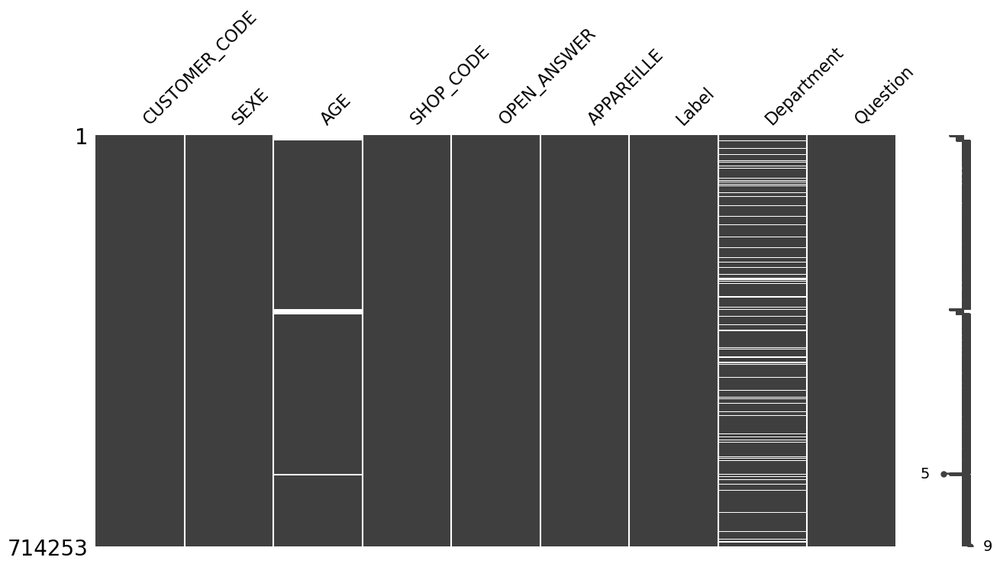

In [7]:
 msno.matrix(df_Qs,figsize=(15,7))

In [8]:
missing_percent = df_Qs.isna().mean() * 100  # Returns a Series with percentages of missing values
missing_percent

CUSTOMER_CODE     0.000000
SEXE              0.000000
AGE               2.995017
SHOP_CODE         0.000000
OPEN_ANSWER       0.000140
APPAREILLE        0.000000
Label             0.043682
Department       11.752278
Question          0.000000
dtype: float64

<Axes: >

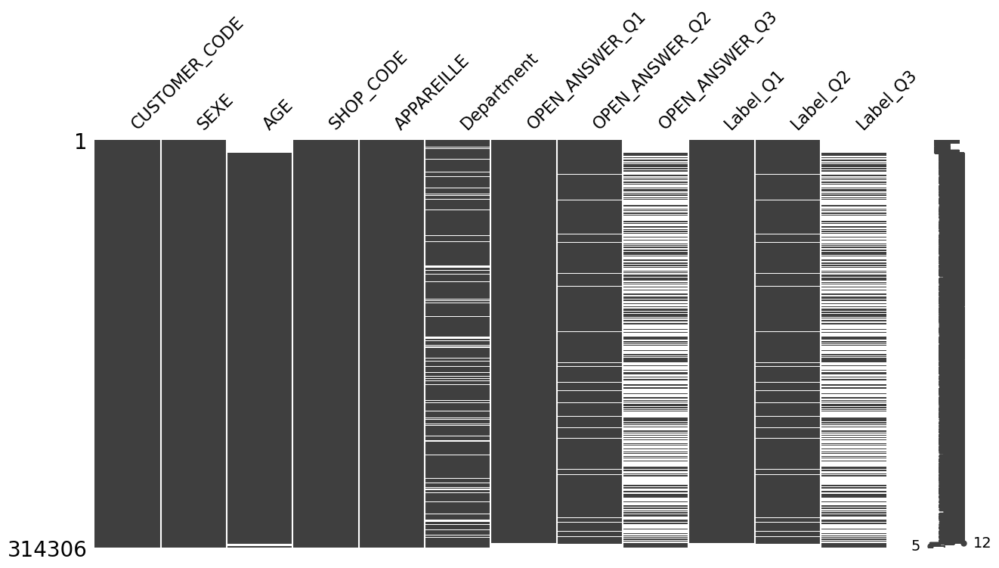

In [9]:
 msno.matrix(df_Ps,figsize=(15,7))

In [10]:
missing_percent = df_Ps.isna().mean() * 100  # Returns a Series with percentages of missing values
missing_percent

CUSTOMER_CODE      0.000000
SEXE               0.000000
AGE                3.778802
SHOP_CODE          0.000000
APPAREILLE         0.000000
Department        11.831145
OPEN_ANSWER_Q1     1.145699
OPEN_ANSWER_Q2     6.371816
OPEN_ANSWER_Q3    57.519106
Label_Q1           1.151426
Label_Q2           6.421131
Label_Q3          57.565557
dtype: float64

<Axes: >

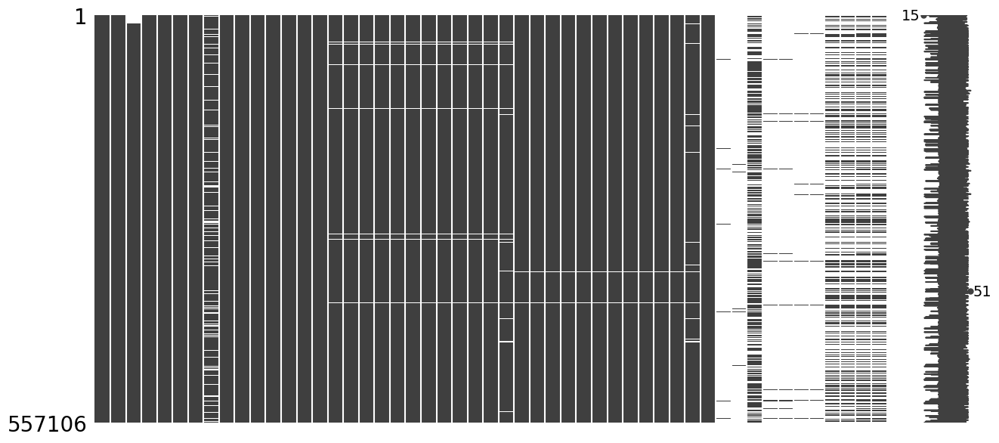

In [11]:
 msno.matrix(df_Qs_Tests, figsize=(15,7))

In [12]:
missing_percent = df_Qs_Tests.isna().mean() * 100  # Returns a Series with percentages of missing values
missing_percent

CUSTOMER_CODE                 0.000000
SEXE                          0.000000
AGE                           2.036955
SHOP_CODE                     0.000000
OPEN_ANSWER                   0.000000
APPAREILLE                    0.000000
Label                         0.000000
Department                   11.971151
Question                      0.000000
CENTRE                        0.000000
DATE TEST                     0.000000
TEST                          0.000000
CONDITION                     0.000000
SORTIE                        0.000000
TYPE_TONALE                   0.000000
FREQ_125_G                    1.415709
FREQ_250_G                    1.415709
FREQ_500_G                    1.415709
FREQ_750_G                    1.415709
FREQ_1000_G                   1.415709
FREQ_1500_G                   1.415709
FREQ_2000_G                   1.415709
FREQ_3000_G                   1.415709
FREQ_4000_G                   1.415709
FREQ_6000_G                   1.415709
FREQ_8000_G              

<Axes: >

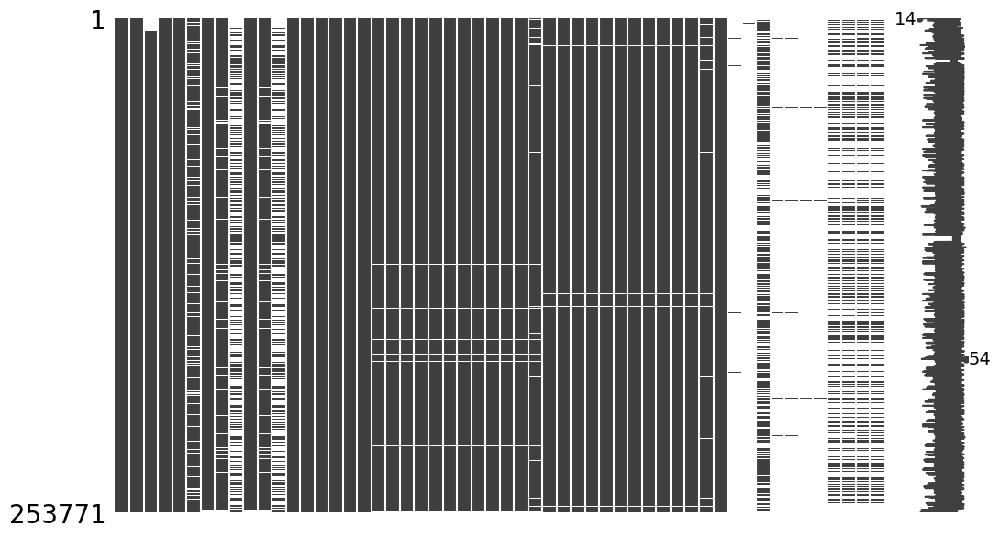

In [13]:
 msno.matrix(df_Ps_Tests, figsize=(12,7))

In [14]:
missing_percent = df_Ps_Tests.isna().mean() * 100  # Returns a Series with percentages of missing values
missing_percent

CUSTOMER_CODE                 0.000000
SEXE                          0.000000
AGE                           2.622049
SHOP_CODE                     0.000000
APPAREILLE                    0.000000
Department                   11.962360
OPEN_ANSWER_Q1                0.570593
OPEN_ANSWER_Q2                5.540822
OPEN_ANSWER_Q3               55.662783
Label_Q1                      0.570593
Label_Q2                      5.540822
Label_Q3                     55.662783
CENTRE                        0.000000
DATE TEST                     0.000000
TEST                          0.000000
CONDITION                     0.000000
SORTIE                        0.000000
TYPE_TONALE                   0.000000
FREQ_125_G                    1.412297
FREQ_250_G                    1.412297
FREQ_500_G                    1.412297
FREQ_750_G                    1.412297
FREQ_1000_G                   1.412297
FREQ_1500_G                   1.412297
FREQ_2000_G                   1.412297
FREQ_3000_G              

# Number of Shops

In [8]:
shop_counts_df = df_code_loc['Department'].value_counts().reset_index()
shop_counts_df.columns = ['nom', 'Count']

map_france_shop = gdf_dpt_avec_om
map_france_shop = map_france_shop.merge(shop_counts_df, on='nom', how='inner')

shop_per_dep = df_code_loc['Department'].value_counts()

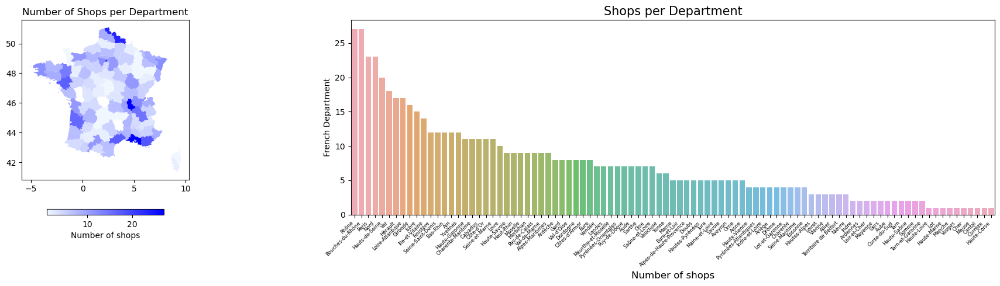

In [9]:
colors = [(0.94, 0.97, 1.0), (0.0, 0.0, 1.0)]  # Azure to blue

# Create a custom colormap
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

# Plot the GeoDataFrame with color based on the count using the custom colormap & the barplot
fig, axs = plt.subplots(1, 2, figsize=(21,5))

# Plot the first map
map0 = map_france_shop.plot(column='Count', legend=False, cmap=custom_cmap, ax=axs[0])
# Add a colorbar legend
cbar = plt.colorbar(map0.collections[0], ax=map0, orientation='horizontal', fraction=0.03)
cbar.set_label('Number of shops')
axs[0].set_title('Number of Shops per Department')
#axs[0].legend(title='Count')

# Plot the second barplot
ax = sn.barplot(x=shop_per_dep.index, y=shop_per_dep.values, alpha=0.8, ax=axs[1])
ax.set_xticklabels([label.get_text() for label in ax.get_xticklabels()], rotation=45, ha='right')
ax.tick_params(axis='x', labelsize=6)
ax.set_xlabel('Number of shops', fontsize=12)
ax.set_ylabel('French Department', fontsize=10)
ax.set_title("Shops per Department", fontsize=15)

# Adjust layout
plt.tight_layout()

plt.show()

# Population per Department

In [10]:
map_pop_dep = gdf_dpt_avec_om
pop_dep.rename(columns={'Nom du département': 'nom','Code département': 'code'}, inplace=True)

map_france_pop = pd.merge(map_pop_dep, pop_dep, on = ('nom'), how = "inner" ) 
map_france_pop['Population municipale'] = map_france_pop['Population municipale'].str.replace(' ', '').astype(int)

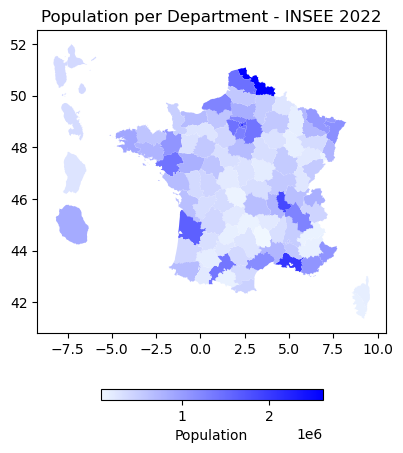

In [11]:
# Plot the GeoDataFrame with color based on the count
# Plot the map
ax = map_france_pop.plot(column='Population municipale', legend=False, cmap=custom_cmap)

# Add a colorbar legend
cbar = plt.colorbar(ax.collections[0], ax=ax, orientation='horizontal', fraction=0.03)
cbar.set_label('Population')

# Add a title
ax.set_title('Population per Department - INSEE 2022')

plt.show()

# Proportion of shops per person within each department

In [12]:
prop_shop_pop = pd.merge(map_france_shop, map_france_pop, on=('nom','geometry'), how = 'inner')
prop_shop_pop['shops_per_person'] = prop_shop_pop['Count'] / prop_shop_pop['Population municipale']

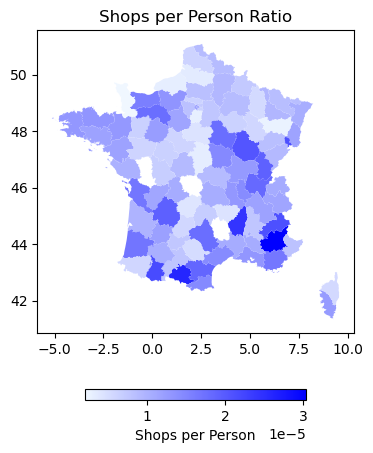

In [13]:
# Plot the GeoDataFrame with color based on the count -- NEED TO CHECK THIS
# Plot the map
ax = prop_shop_pop.plot(column='shops_per_person', legend=False, cmap=custom_cmap)

# Add a colorbar legend
cbar = plt.colorbar(ax.collections[0], ax=ax, orientation='horizontal', fraction=0.03)
cbar.set_label('Shops per Person')

# Add a title
ax.set_title('Shops per Person Ratio')

plt.show()

# Final Plots Demographic plot

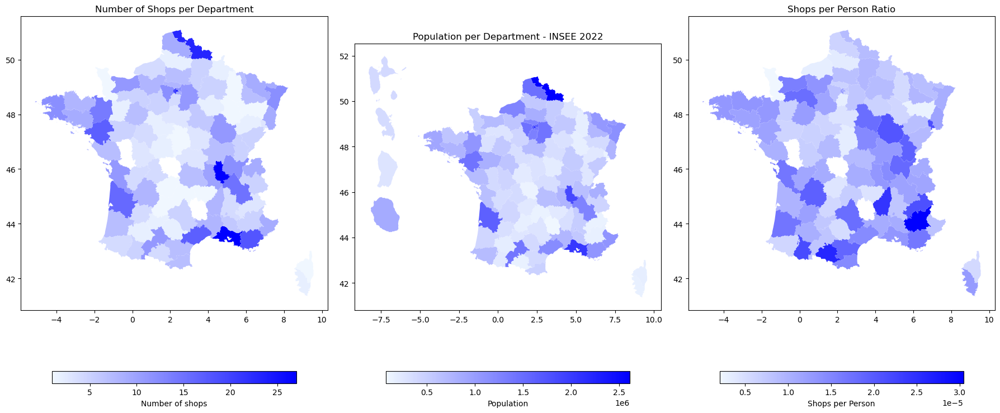

In [14]:
# Create a figure with three subplots in a single row
fig, axs = plt.subplots(1, 3, figsize=(18, 8))

# Plot the first map
map0 = map_france_shop.plot(column='Count', legend=False, cmap=custom_cmap, ax=axs[0])
cbar = plt.colorbar(map0.collections[0], ax=map0, orientation='horizontal', fraction=0.03)
cbar.set_label('Number of shops')
axs[0].set_title('Number of Shops per Department')

# Plot the second map
map1 = map_france_pop.plot(column='Population municipale', legend=False, cmap=custom_cmap, ax=axs[1])
cbar = plt.colorbar(map1.collections[0], ax=map1, orientation='horizontal', fraction=0.03)
cbar.set_label('Population')
axs[1].set_title('Population per Department - INSEE 2022')

# Plot the third map
map2 = prop_shop_pop.plot(column='shops_per_person', legend=False, cmap=custom_cmap, ax=axs[2])
cbar = plt.colorbar(map2.collections[0], ax=map2, orientation='horizontal', fraction=0.03)
cbar.set_label('Shops per Person')
axs[2].set_title('Shops per Person Ratio')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


# Question Analysis

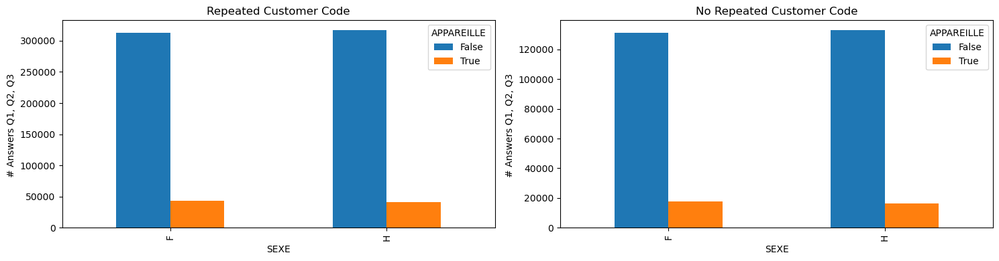

In [15]:
# Create a figure with two subplots arranged horizontally
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# Plot the first bar plot
df_Qs_counts = df_Qs.groupby(['SEXE', 'APPAREILLE']).size().reset_index(name='Count')
pivot_dfqS_counts = df_Qs_counts.pivot(index='SEXE', columns='APPAREILLE', values='Count')
pivot_dfqS_counts.plot(kind='bar', stacked=False, ax=axes[0])
axes[0].set_ylabel('# Answers Q1, Q2, Q3 ')
axes[0].set_title('Repeated Customer Code')

# Plot the second bar plot
df_Qs_counts2 = df_Qs.drop_duplicates(subset='CUSTOMER_CODE', keep='first').groupby(['SEXE', 'APPAREILLE']).size().reset_index(name='Count')
pivot_dfqS_counts2 = df_Qs_counts2.pivot(index='SEXE', columns='APPAREILLE', values='Count')
pivot_dfqS_counts2.plot(kind='bar', stacked=False, ax=axes[1])
axes[1].set_ylabel('# Answers Q1, Q2, Q3 ')
axes[1].set_title('No Repeated Customer Code')

# Adjust layout
plt.tight_layout()

plt.show()


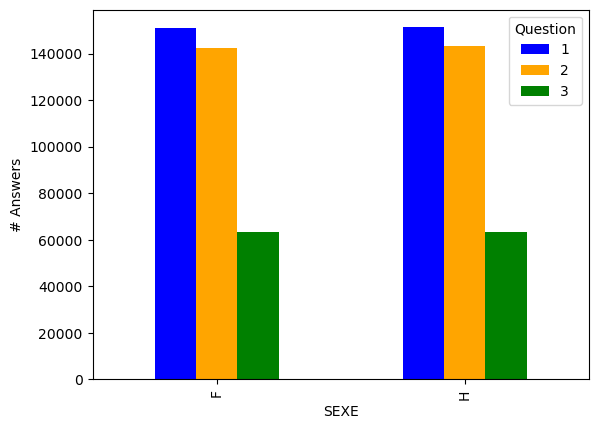

In [16]:
colors = ['blue', 'orange', 'green']

n_answers = df_Qs.groupby(['Question', "SEXE"]).size().reset_index(name='Count')

pivot_df_answers = n_answers.pivot(index='SEXE', columns='Question', values='Count')
ax = pivot_df_answers.plot(kind='bar', stacked=False, legend=True, color=colors)

plt.ylabel('# Answers')
plt.show()

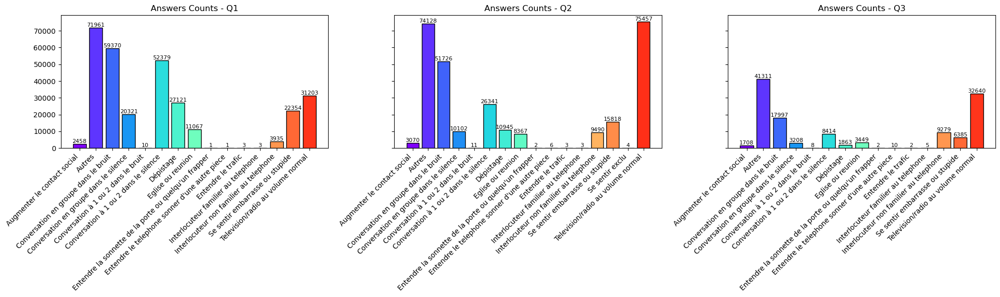

In [17]:
# Create a 1x3 grid of subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

# Plot each DataFrame on a separate subplot
plot_label_counts(axs[0], df_Q1, 'Answers Counts - Q1')
plot_label_counts(axs[1], df_Q2, 'Answers Counts - Q2')
plot_label_counts(axs[2], df_Q3, 'Answers Counts - Q3')

plt.tight_layout()
plt.show()

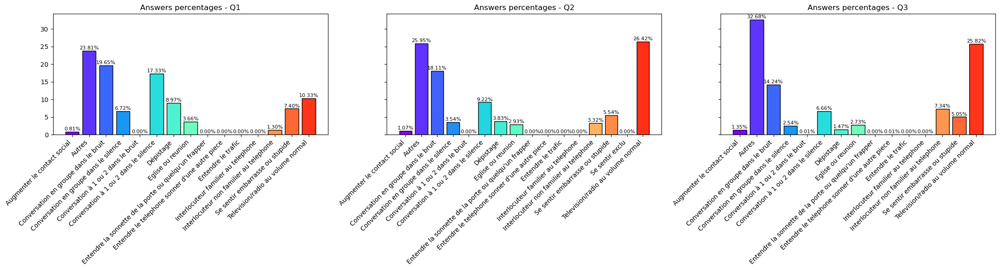

In [18]:
# Create a 1x3 grid of subplots
fig, axs = plt.subplots(1, 3, figsize=(22, 6), sharey=True)

# Plot each DataFrame on a separate subplot
plot_percentage_bars(axs[0], df_Q1, 'Answers percentages - Q1')
plot_percentage_bars(axs[1], df_Q2, 'Answers percentages - Q2')
plot_percentage_bars(axs[2], df_Q3, 'Answers percentages - Q3')

plt.tight_layout()
plt.show()

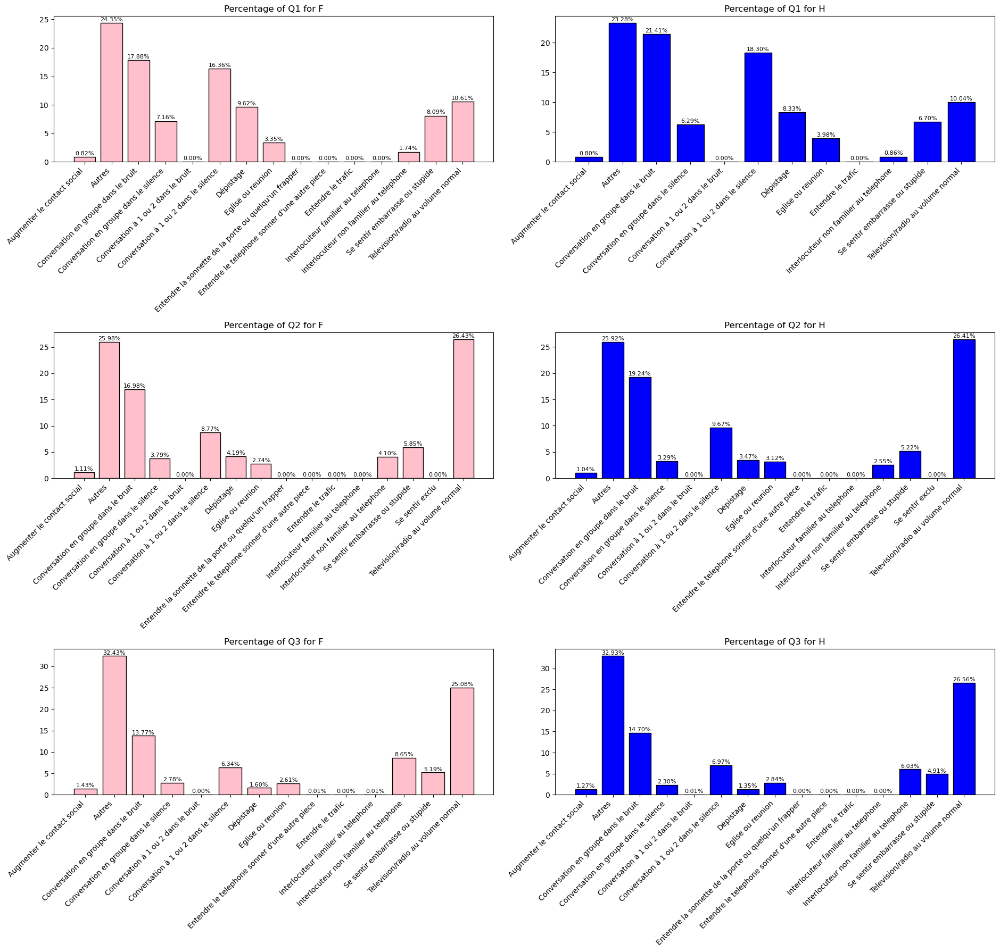

In [19]:
# Distribution by Gender and Questions - hence the proportion is computed within the group 

fig, axs = plt.subplots(3, 2, figsize=(19, 18))

# Define colors for male and female groups
colors = ['pink', 'blue']

# Iterate over each dataset and apply the plot_percentage_bars function
for i, df in enumerate([df_Q1, df_Q2, df_Q3]):
    for j, (sex, group_df) in enumerate(df.groupby('SEXE')):
        # Call the plot_percentage_bars function for each group and pass the axis, group_df, and title
        plot_percentage_bars(axs[i, j], group_df, f'Percentage of Q{i+1} for {sex}')
        
        # Set the color for bars in this subplot
        for bar in axs[i, j].patches:
            bar.set_facecolor(colors[j])

# Show the plot
plt.tight_layout()
plt.show()



### Age Distribution by Priority Answers - no Depistage

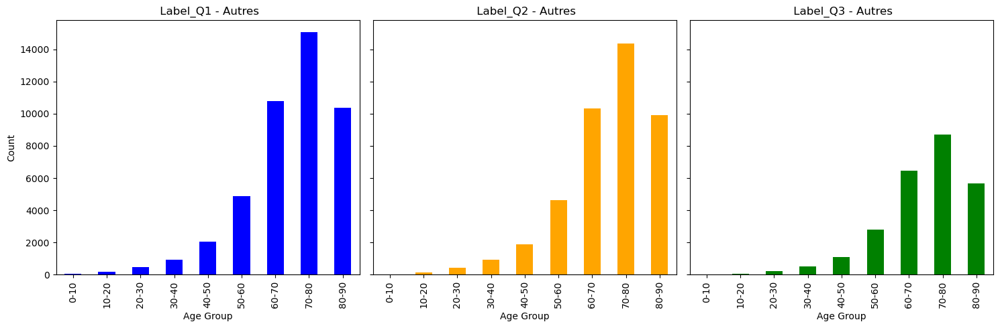

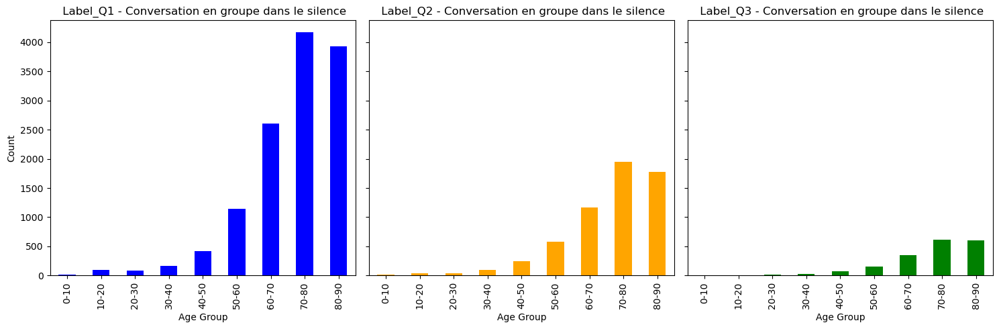

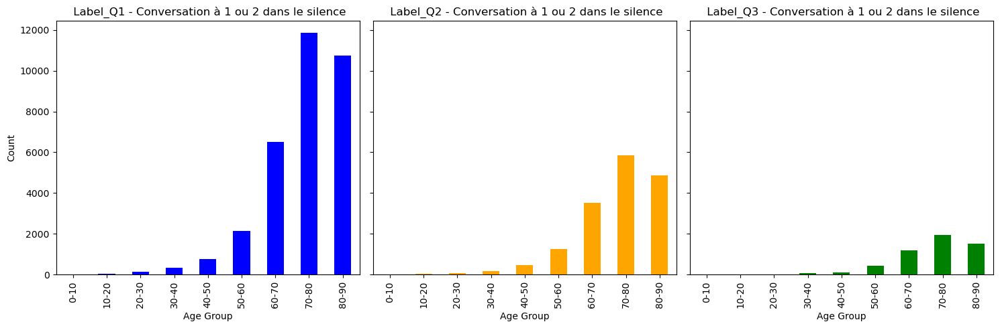

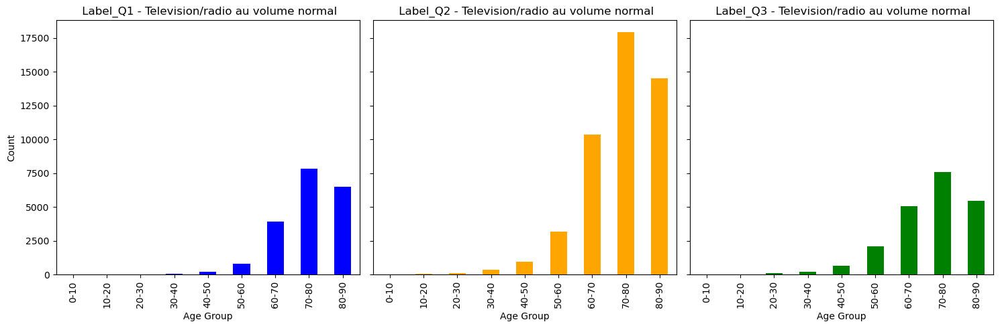

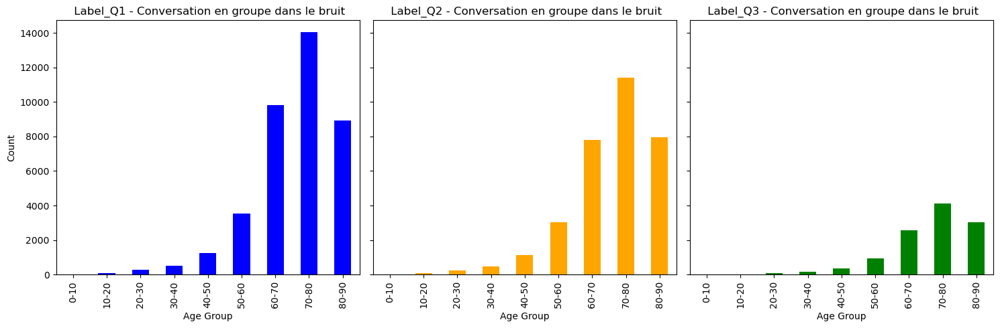

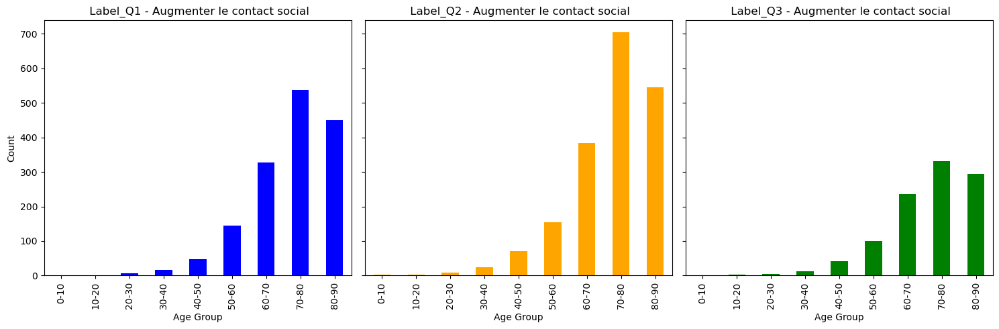

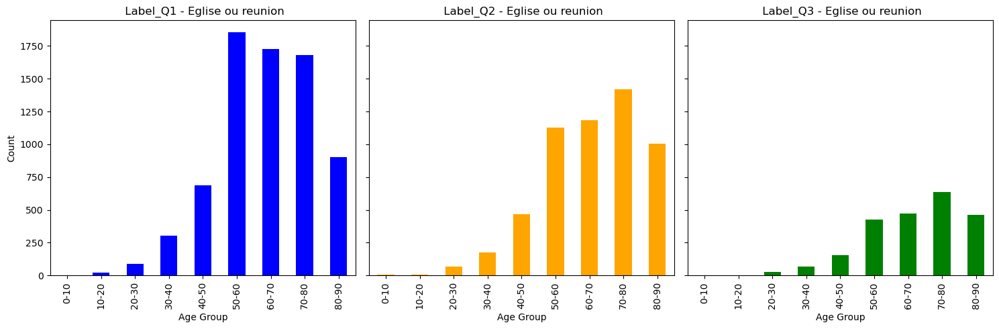

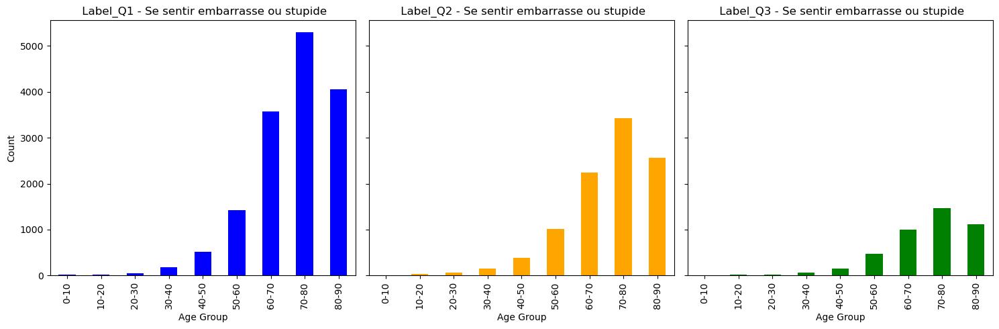

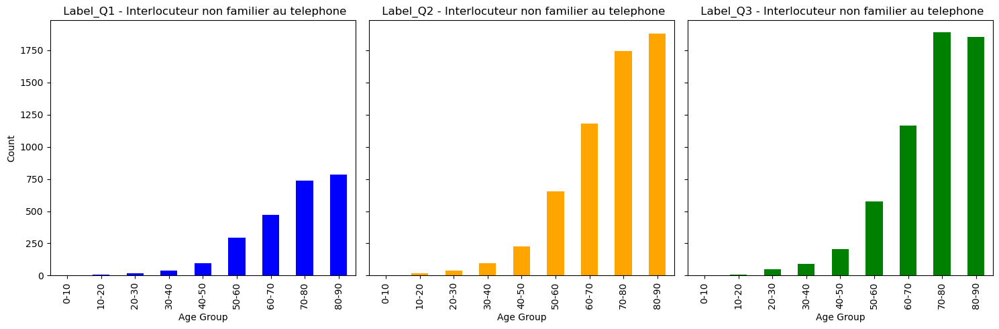

In [20]:
label_columns = ['Label_Q1', 'Label_Q2', 'Label_Q3']
priority_to_plot = priority_cat

for i in range(len(priority_to_plot)):
    plot_age_distribution(df_Ps_Tests_nodep, label_columns, priority_to_plot[i], bins, labels_age)

## Questions Spatial Distribution

No Depistage


In [21]:
grouped_label_dp = df_Qs_nodep.groupby(['Label'])
unique_groups = list(grouped_label_dp.groups.keys())
split_label_dp = [grouped_label_dp.get_group(group) for group in unique_groups]

split_label_dp = [split_label_dp[i].drop_duplicates(subset='CUSTOMER_CODE', keep='first') for i in range(0,len(split_label_dp))]


mydept = split_label_dp[0]["Department"].unique()



# Iterate through split_label_dp and fill missing values in the 'Department' column
for i in range(len(split_label_dp)):
    missing_departments = set(mydept) - set(split_label_dp[i]['Department'].unique())
    
    if missing_departments:
        # Fill missing values with a default value (you can choose a different strategy)
        missing_rows = pd.DataFrame({'CUSTOMER_CODE': [np.nan] * len(missing_departments),
                                     'SEXE': [np.nan] * len(missing_departments),
                                     'AGE': [np.nan] * len(missing_departments),
                                     'SHOP_CODE': [np.nan] * len(missing_departments),
                                     'OPEN_ANSWER': [np.nan] * len(missing_departments),
                                     'APPAREILLE': [np.nan] * len(missing_departments),
                                     'Label': ['Conversation à 1 ou 2 dans le bruit'] * len(missing_departments),
                                     'Department': list(missing_departments)})
        split_label_dp[i] = pd.concat([split_label_dp[i], missing_rows]).reset_index(drop=True)




pp_counts_label = [ split_label_dp[i]['Department'].value_counts().reset_index() for i in range(0,len(split_label_dp))]

for i in range(0,len(pp_counts_label)):
    pp_counts_label[i].columns = ['nom', 'Count']



labels_plot = [split_label_dp[i]["Label"].unique()[0]  for i in range(0,len(split_label_dp))]


map_france_labels = [gdf_dpt_avec_om for i in range(0,len(split_label_dp))]
map_france_labels = [map_france_labels[i].merge(pp_counts_label[i], on='nom', how='inner') for i in range(0,len(split_label_dp))]

C:\Users\mcampi\AppData\Local\Temp\ipykernel_12836\2680532277.py:26: FutureWarning:

Behavior when concatenating bool-dtype and numeric-dtype arrays is deprecated; in a future version these will cast to object dtype (instead of coercing bools to numeric values). To retain the old behavior, explicitly cast bool-dtype arrays to numeric dtype.

C:\Users\mcampi\AppData\Local\Temp\ipykernel_12836\2680532277.py:26: FutureWarning:

Behavior when concatenating bool-dtype and numeric-dtype arrays is deprecated; in a future version these will cast to object dtype (instead of coercing bools to numeric values). To retain the old behavior, explicitly cast bool-dtype arrays to numeric dtype.

C:\Users\mcampi\AppData\Local\Temp\ipykernel_12836\2680532277.py:26: FutureWarning:

Behavior when concatenating bool-dtype and numeric-dtype arrays is deprecated; in a future version these will cast to object dtype (instead of coercing bools to numeric values). To retain the old behavior, explicitly cast bool-

In [22]:
# Define light green and dark green colors
light_green = '#B2DDFF'
dark_green = '#0072B2'

# Create LinearSegmentedColormap
cmap_labels = LinearSegmentedColormap.from_list('cmap_labels', [light_green, dark_green])

In [23]:
len(labels_plot)

14

C:\Users\mcampi\AppData\Local\Temp\ipykernel_12836\3484101922.py:6: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



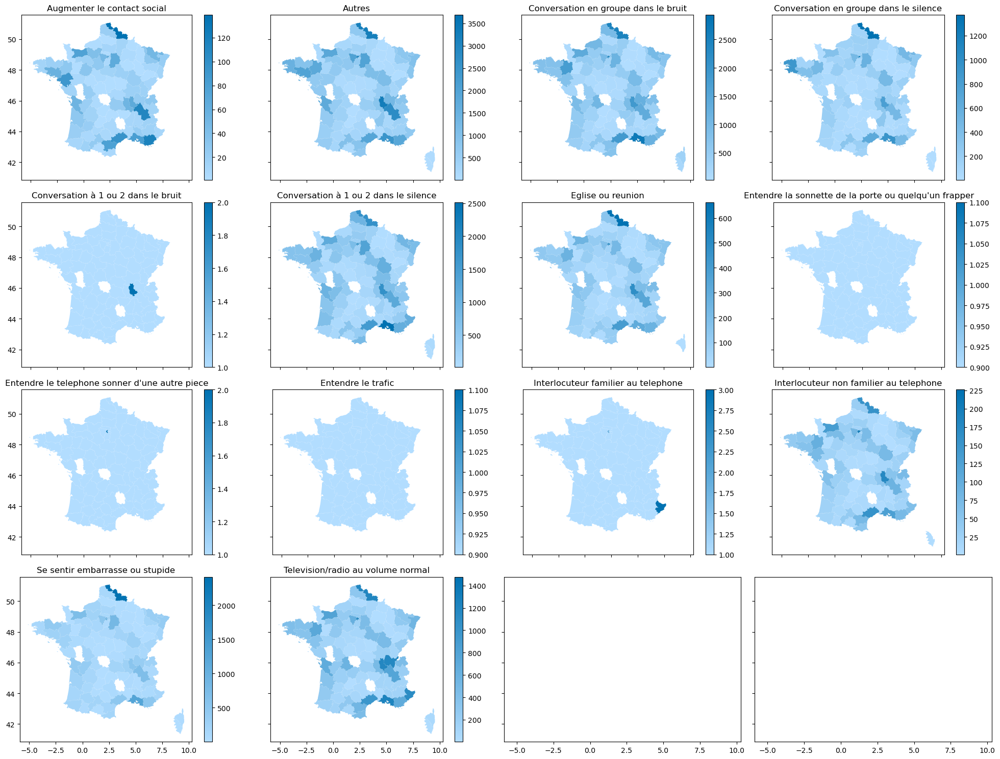

In [24]:
num_maps =  len(map_france_labels)
num_shades = 50  

# Create a list of 16 colormaps, each with varying shades
cmap_names = ['Blues', 'Reds', 'Greens', 'winter', 'Purples', 'Oranges', 'Greys', 'BuPu', 'RdYlBu', 'PuRd', 'YlOrBr', 'RdPu', 'YlOrRd', 'BuGn', 'YlGn', 'PuBu']
cmaps = [ListedColormap(plt.cm.get_cmap(name, num_shades)(np.linspace(0, 1, num_shades))) for name in cmap_names]

# Create subplots
fig, axs = plt.subplots(4, 4, figsize=(20, 15), sharex=True, sharey=True)
axs = axs.flatten()

for i, (gdf, label) in enumerate(zip(map_france_labels, labels_plot)):
    gdf.plot(column='Count', legend=True, cmap=cmap_labels, #plt.cm.get_cmap("ocean"),   #cmaps[i], -- more work for this -- use ocean_r but fix it 
              ax=axs[i], vmin=np.min(map_france_labels[i]["Count"]),
               vmax=np.max(map_france_labels[i]["Count"]))
    axs[i].set_title(label)

plt.tight_layout()
plt.show()

# COSI Population Analysis


To conduct this analysis, depistage is removed from the data and the population of COSI is studied - this means that characteristics of people are explored - not number of questions

### Age Distribution

In [25]:
# Filter out ages less than 0 or greater than 120
valid_age_df = df_Ps_nodep[(df_Ps_nodep['AGE'] >= 0) & (df_Ps_nodep['AGE'] <= 120)]

# Count the occurrences of each age
dfPs_age_count = valid_age_df['AGE'].value_counts()

# Create the bar plot
trace = go.Bar(
    x=dfPs_age_count.index,
    y=dfPs_age_count.values,
    marker=dict(
        color = dfPs_age_count.values,
        colorscale='Viridis',
        showscale=True
    ),
)

# Define layout for the plot
layout = go.Layout(
    title='Age Distribution'
)

# Create the plot
data = [trace]
fig = go.Figure(data=data, layout=layout)

# Plot the figure
py.iplot(fig, filename="age")


In [27]:
dfPs_sexage_count = valid_age_df.groupby(['SEXE', 'AGE']).size().reset_index(name='Count')

# Create bar plots for each SEX category
traces = []
color =['viridis', 'plasma'] 
for i, sex_value in enumerate(dfPs_sexage_count['SEXE'].unique()):
    subset = dfPs_sexage_count[dfPs_sexage_count['SEXE'] == sex_value]
    trace = go.Bar(
        x=subset['AGE'],
        y=subset['Count'],
        name=f'SEX {sex_value}',
        marker=dict(
            color=subset['Count'],
           colorscale=color[i],  # Choose a color scale
            showscale=True
        ),
    )
    traces.append(trace)

layout = go.Layout(
    title='Age Distribution by SEX',
    xaxis=dict(title='Age'),
    yaxis=dict(title='Count'),
    barmode='group',  # To show grouped bar plots
)

layout = go.Layout(
        title=f'Age Distribution for SEX',
        xaxis=dict(title='Age'),
        yaxis=dict(title='Count'),
    )
    

fig = go.Figure(data=traces, layout=layout)
py.iplot(fig, filename="age_distribution_by_sex")

### Average Age by Department

In [28]:
df_dp_filt = df_Ps_nodep[df_Ps_nodep['Department'] != 'NA']
df_dp_filt = df_Ps_nodep[df_Ps_nodep['AGE'] != 'NA']

# Calculate the average age within each Department
average_age_dp = df_dp_filt.groupby('Department')['AGE'].mean().reset_index()
average_age_dp.columns = ['nom', 'Average Age']

map_france_av_age = gdf_dpt_avec_om
map_france_av_age = map_france_av_age.merge(average_age_dp, on='nom', how='inner')


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


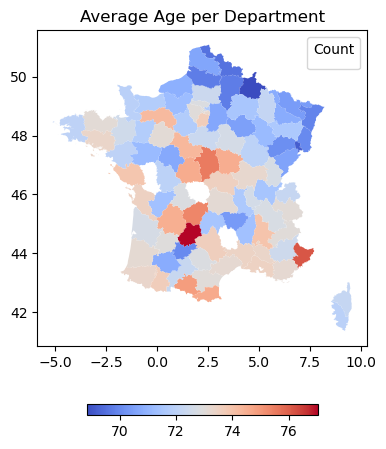

In [29]:
# Plot the GeoDataFrame with color based on the count
ax = map_france_av_age.plot(column='Average Age', legend=False, figsize=(7, 5), cmap='coolwarm') #viridis plasma coolwarm cividis rainbow inferno
cbar = plt.colorbar(ax.collections[0], ax=ax, orientation='horizontal', fraction=0.03)
cbar.set_label('')

# Add a title and adjust legend settings if needed
ax.set_title('Average Age per Department')
ax.legend(title='Count')

plt.show()

### Average Age by Department weighted according to number of people in that department

In [30]:
df_dp_filt = df_Ps_nodep[df_Ps_nodep['Department'] != 'NA']
df_dp_filt = df_Ps_nodep[df_Ps_nodep['AGE'] != 'NA']

# Calculate the total count of people in each department
total_count_per_department = df_dp_filt['Department'].value_counts().reset_index()
total_count_per_department.columns = ['Department', 'Total_Count']

# Merge with the DataFrame containing filtered age data
df_dp_filt = df_dp_filt.merge(total_count_per_department, on='Department', how='left')

# Calculate the weighted sum of ages within each department
df_dp_filt['Weighted_Age'] = df_dp_filt['AGE'] * df_dp_filt['Total_Count']

df_dp_filt.rename(columns={'Department': 'nom'}, inplace=True)

# Calculate the weighted average age within each department
weighted_average_age_dp = df_dp_filt.groupby('nom')['Weighted_Age'].sum() / df_dp_filt.groupby('nom')['Total_Count'].sum()

# Merge with the department GeoDataFrame
map_france_weighted_av_age = gdf_dpt_avec_om.merge(weighted_average_age_dp.reset_index(name='Weighted_Average_Age'), on='nom', how='inner')


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


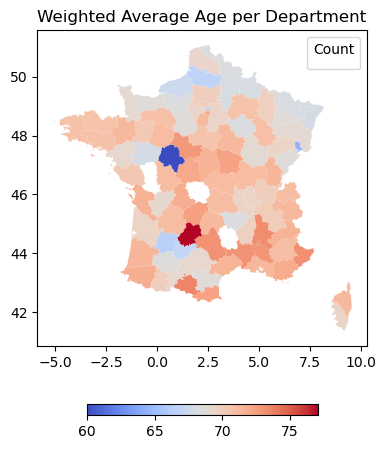

In [31]:
# Plot the GeoDataFrame with color based on the count
ax = map_france_weighted_av_age.plot(column='Weighted_Average_Age', legend=False, figsize=(7, 5), cmap='coolwarm') #viridis plasma coolwarm cividis rainbow inferno
cbar = plt.colorbar(ax.collections[0], ax=ax, orientation='horizontal', fraction=0.03)
cbar.set_label('')

# Add a title and adjust legend settings if needed
ax.set_title('Weighted Average Age per Department')
ax.legend(title='Count')

plt.show()

### Gender Distribution

In [32]:
# Define custom segmented color maps for male (blue shades) and female (pink shades)
cmap_male = LinearSegmentedColormap.from_list('cmap_male', ['#B2DDFF', '#0072B2'])
cmap_female = LinearSegmentedColormap.from_list('cmap_female', ['#FFB2C8', '#E30066'])

q_grouped_sexdp = df_Ps_nodep.groupby(['SEXE'])
unique_groups = list(q_grouped_sexdp.groups.keys())
split_q_sexdp = [q_grouped_sexdp.get_group(group) for group in unique_groups]

In [33]:
pp_counts_df_f = split_q_sexdp[0]['Department'].value_counts().reset_index()
pp_counts_df_f.columns = ['nom', 'Count']

pp_counts_df_m = split_q_sexdp[1]['Department'].value_counts().reset_index()
pp_counts_df_m.columns = ['nom', 'Count']

map_france_f = gdf_dpt_avec_om
map_france_f = map_france_f.merge(pp_counts_df_f, on='nom', how='inner')

map_france_m = gdf_dpt_avec_om
map_france_m = map_france_m.merge(pp_counts_df_m, on='nom', how='inner') 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


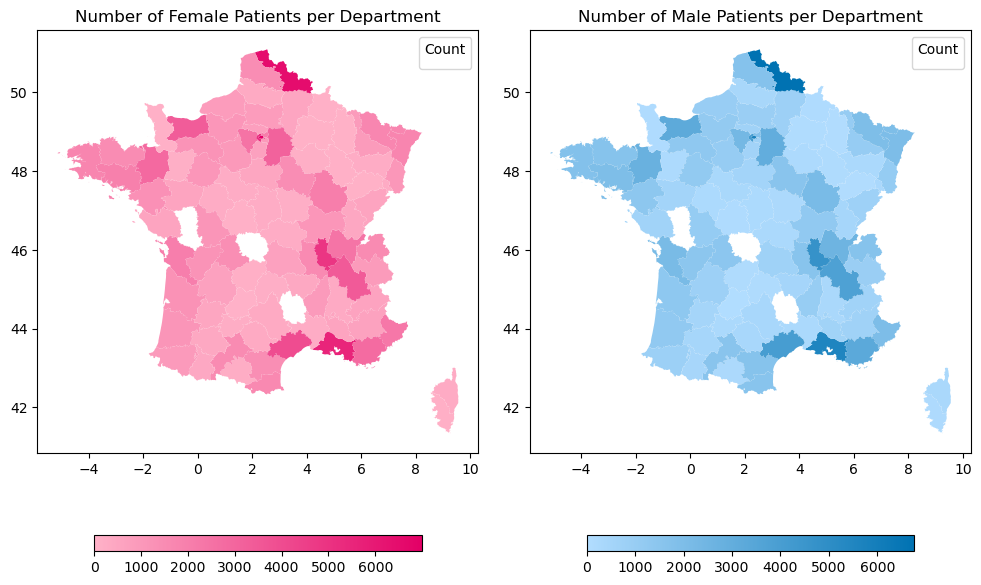

In [34]:
# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 6))

# Plot the GeoDataFrame with color based on the count in the first subplot
map_france_ff = map_france_f.plot(column='Count', legend=False, ax=axs[0], cmap=cmap_female, vmin=0, vmax=np.max(map_france_f["Count"]))
cbar = plt.colorbar(map_france_ff.collections[0], ax=map_france_ff, orientation='horizontal', fraction=0.03)
cbar.set_label('')
axs[0].set_title('Number of Female Patients per Department')
axs[0].legend(title='Count')

# Plot the GeoDataFrame with color based on the count in the second subplot
map_france_mm = map_france_m.plot(column='Count', legend=False, ax=axs[1], cmap=cmap_male, vmin=0, vmax=np.max(map_france_m["Count"]))
cbar = plt.colorbar(map_france_mm.collections[0], ax=map_france_mm, orientation='horizontal', fraction=0.03)
cbar.set_label('')
axs[1].set_title('Number of Male Patients per Department')
axs[1].legend(title='Count')

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [ ]:
#weight by number of people as for age

# Hearing AIDs Users 

In [35]:
#Percentage of people with and without over the entire population - REMOVED depistage (or #weight by number of people as for age)

grouped_appdp = df_Ps_nodep.groupby(['APPAREILLE'])
unique_groups = list(grouped_appdp.groups.keys())
split_appdp = [grouped_appdp.get_group(group) for group in unique_groups]

# Calculate total count of the entire population
total_population = df_Ps_nodep['Department'].value_counts().reset_index()
total_population.columns = ['nom', 'Total_Count']

# Group by APPAREILLE
grouped_appdp = df_Ps_nodep.groupby(['APPAREILLE'])

# Calculate counts for each group
pp_countsapp_df_n = split_appdp[0]['Department'].value_counts().reset_index()
pp_countsapp_df_n.columns = ['nom', 'Count']

pp_countsapp_df_y = split_appdp[1]['Department'].value_counts().reset_index()
pp_countsapp_df_y.columns = ['nom', 'Count']

# Merge with total count of the entire population
pp_countsapp_df_n = pp_countsapp_df_n.merge(total_population, on='nom', how='left')
pp_countsapp_df_y = pp_countsapp_df_y.merge(total_population, on='nom', how='left')

# Calculate percentage for each group out of the entire population
pp_countsapp_df_n['Percentage'] = (pp_countsapp_df_n['Count'] / pp_countsapp_df_n['Total_Count']) * 100
pp_countsapp_df_y['Percentage'] = (pp_countsapp_df_y['Count'] / pp_countsapp_df_y['Total_Count']) * 100

# Merge with the department GeoDataFrame
map_france_ppapp_n = gdf_dpt_avec_om.merge(pp_countsapp_df_n[['nom', 'Percentage']], on='nom', how='inner')
map_france_ppapp_y = gdf_dpt_avec_om.merge(pp_countsapp_df_y[['nom', 'Percentage']], on='nom', how='inner')

C:\Users\mcampi\AppData\Local\Temp\ipykernel_12836\3983396056.py:28: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



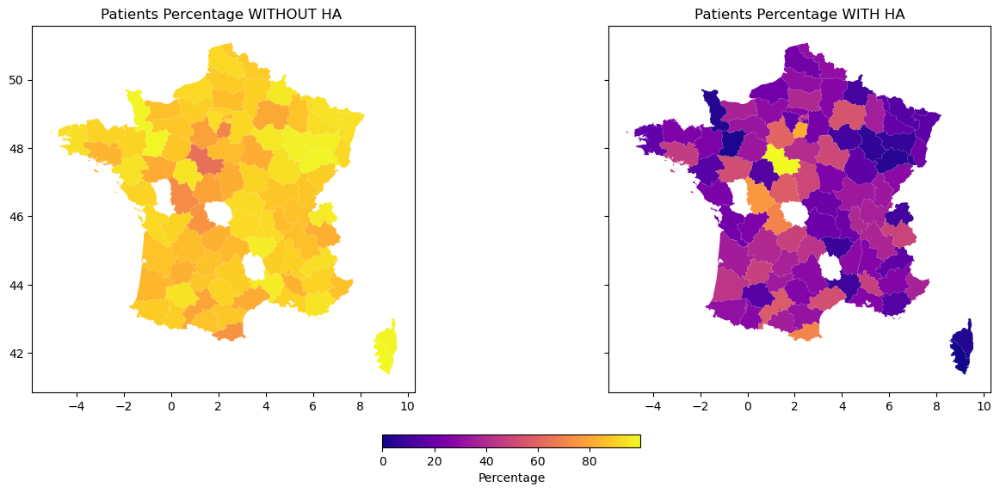

In [36]:
# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 5), sharex=True, sharey=True)

# Plot the GeoDataFrame with color based on the count in the first subplot
map_france_ppapp_n.plot(column='Percentage', legend=False, ax=axs[0], cmap='plasma',
                         vmin=0,
                         vmax=np.max(map_france_ppapp_n["Percentage"]))
axs[0].set_title('Patients Percentage WITHOUT HA ')

# Plot the GeoDataFrame with color based on the count in the second subplot
map_france_ppapp_y.plot(column='Percentage', legend=False, ax=axs[1], cmap='plasma', 
                        vmin=0,
                        vmax=np.max(map_france_ppapp_y["Percentage"]))
axs[1].set_title('Patients Percentage WITH HA')

# Create a single color bar for both subplots
# Create a single color bar for both subplots
cbar = fig.colorbar(axs[0].collections[0], ax=axs, orientation='horizontal', pad=-0.5,
                    aspect=20)
cbar.set_label('Percentage')

# Adjust the position of the color bar
cbar.ax.set_position([0.15, -0.05, 0.7, 0.03])  # [left, bottom, width, height]

plt.subplots_adjust(wspace=0.1)

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

In [37]:
label_columns

['Label_Q1', 'Label_Q2', 'Label_Q3']

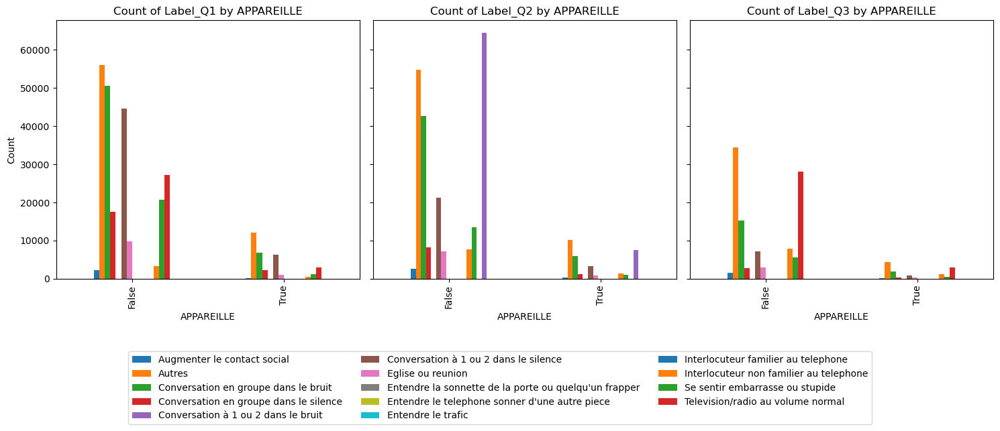

In [151]:
# Group by APPAREILLE
grouped_appdp_priority = df_Ps_nodep.groupby('APPAREILLE')

# Define the labels to count
label_columns = ['Label_Q1', 'Label_Q2', 'Label_Q3']

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

for i, label in enumerate(label_columns):
    # Count occurrences of each label for each group
    label_counts = grouped_appdp_priority[label].value_counts().unstack()
    
    # Plot the bar chart
    label_counts.plot(kind='bar', ax=axs[i], legend = False)
    axs[i].set_xlabel('APPAREILLE')
    axs[i].set_ylabel('Count')
    axs[i].set_title(f'Count of {label} by APPAREILLE')

# Create a single legend
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.29), ncol=3)

plt.tight_layout()
plt.show()


# PTA, SNR, SRT & OTHERS

## PTA

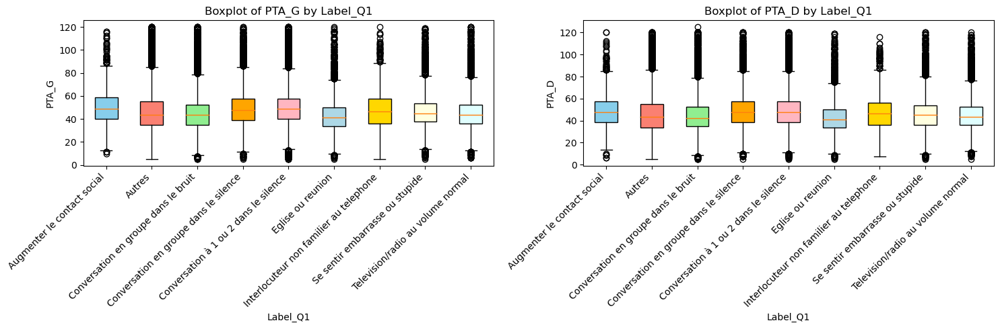

In [150]:
# Group by 'Label_Q1'
grouped_pta = df_Ps_Tests_nodep.groupby('Label_Q1')

# Extract 'PTA_G' and 'PTA_D' data for boxplot
pta_g_data = [group['PTA_G'].dropna() for _, group in grouped_pta]
pta_d_data = [group['PTA_D'].dropna() for _, group in grouped_pta]

# Define colors for boxplots
colors = ['skyblue', 'salmon', 'lightgreen', 'orange', 'lightpink', 'lightblue', 'gold', 'lightyellow', 'lightcyan']

# Plot boxplot for 'PTA_G' and 'PTA_D' for each group
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Boxplot for 'PTA_G'
bp_g = axes[0].boxplot(pta_g_data, patch_artist=True)
for patch, color in zip(bp_g['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_xticks(range(1, len(grouped_pta)+1))
axes[0].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[0].set_title('Boxplot of PTA_G by Label_Q1')
axes[0].set_xlabel('Label_Q1')
axes[0].set_ylabel('PTA_G')

# Boxplot for 'PTA_D'
bp_d = axes[1].boxplot(pta_d_data, patch_artist=True)
for patch, color in zip(bp_d['boxes'], colors):
    patch.set_facecolor(color)
axes[1].set_xticks(range(1, len(grouped_pta)+1))
axes[1].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[1].set_title('Boxplot of PTA_D by Label_Q1')
axes[1].set_xlabel('Label_Q1')
axes[1].set_ylabel('PTA_D')

plt.tight_layout()
plt.show()

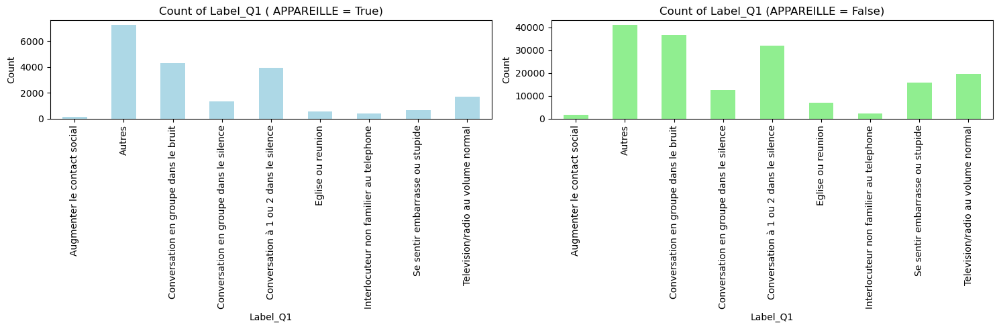

In [149]:
# Filter data with 'APPAREILLE' == True
pta_with_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True]

# Filter data with 'APPAREILLE' == False
pta_without_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False]

# Get count of occurrences of each 'Label_Q1' group for both with and without 'APPAREILLE'
count_with_app = pta_with_app['Label_Q1'].value_counts()
count_without_app = pta_without_app['Label_Q1'].value_counts()

# Sort the count series by index (Label_Q1) to ensure consistency in bar plot ordering
count_with_app = count_with_app.sort_index()
count_without_app = count_without_app.sort_index()

# Plot bar plots for count of 'Label_Q1' groups with and without 'APPAREILLE'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Bar plot for count of 'Label_Q1' with 'APPAREILLE'
count_with_app.plot(kind='bar', ax=axes[0], color='lightblue')
axes[0].set_title('Count of Label_Q1 ( APPAREILLE = True)')
axes[0].set_xlabel('Label_Q1')
axes[0].set_ylabel('Count')

# Bar plot for count of 'Label_Q1' without 'APPAREILLE'
count_without_app.plot(kind='bar', ax=axes[1], color='lightgreen')
axes[1].set_title('Count of Label_Q1 (APPAREILLE = False)')
axes[1].set_xlabel('Label_Q1')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

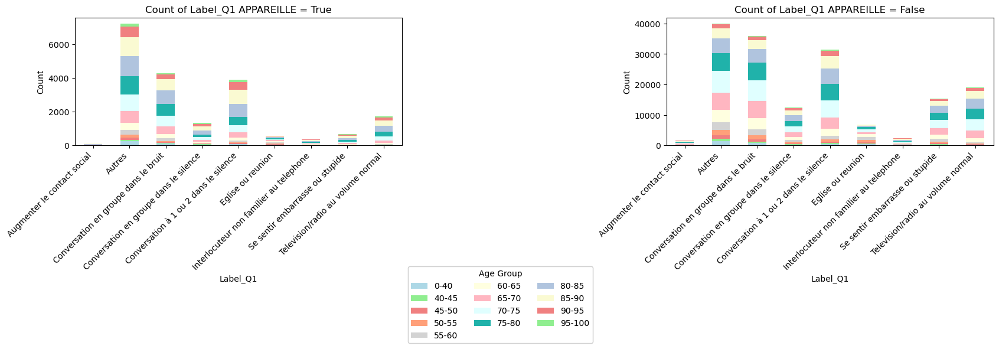

In [192]:
# Define age groups
age_bins = [0, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
age_labels = ['0-40', '40-45', '45-50', '50-55', '55-60', '60-65', '65-70', '70-75', '75-80', '80-85', '85-90', '90-95', '95-100']

# Add 'AGE_GROUP' column to DataFrame based on age bins
df_Ps_Tests_nodep['AGE_GROUP'] = pd.cut(df_Ps_Tests_nodep['AGE'], bins=age_bins, labels=age_labels, right=False)

# Define colors for each age group
age_colors = {
    '0-40': 'lightblue',
    '40-45': 'lightgreen',
    '45-50': 'lightcoral',
    '50-55': 'lightsalmon',
    '55-60': 'lightgrey',
    '60-65': 'lightyellow',
    '65-70': 'lightpink',
    '70-75': 'lightcyan',
    '75-80': 'lightseagreen',
    '80-85': 'lightsteelblue',
    '85-90': 'lightgoldenrodyellow',
    '90-95': 'lightcoral',
    '95-100': 'lightgreen'
}

# Plot bar plots for count of 'Label_Q1' groups for each age group
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(17, 5))

# Plot with 'APPAREILLE'
pta_with_app_grouped = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True].groupby('Label_Q1')['AGE_GROUP'].value_counts().unstack(fill_value=0)
pta_with_app_grouped.plot(kind='bar', stacked=True, ax=axes[0], color=[age_colors[age_group] for age_group in age_labels])
axes[0].set_title('Count of Label_Q1 APPAREILLE = True')
axes[0].set_xlabel('Label_Q1')
axes[0].set_ylabel('Count')
axes[0].legend(title='Age Group', loc='upper center', bbox_to_anchor=(0.5, 0.1), ncol=3, bbox_transform=fig.transFigure)  # Adjust legend position
axes[0].tick_params(axis='x', rotation=45)  # Rotate x-axis tick labels by 45 degrees
for tick in axes[0].get_xticklabels():
    tick.set_horizontalalignment('right')  # Align tick labels to the right

# Plot without 'APPAREILLE'
pta_without_app_grouped = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False].groupby('Label_Q1')['AGE_GROUP'].value_counts().unstack(fill_value=0)
pta_without_app_grouped.plot(kind='bar', stacked=True, ax=axes[1], color=[age_colors[age_group] for age_group in age_labels])
axes[1].set_title('Count of Label_Q1 APPAREILLE = False')
axes[1].set_xlabel('Label_Q1')
axes[1].set_ylabel('Count')
axes[1].legend(title='Age Group', loc='upper center', bbox_to_anchor=(0.5, 0.1), ncol=3, bbox_transform=fig.transFigure)  # Adjust legend position
axes[1].tick_params(axis='x', rotation=45)  # Rotate x-axis tick labels by 45 degrees
for tick in axes[1].get_xticklabels():
    tick.set_horizontalalignment('right')  # Align tick labels to the right

plt.tight_layout()
plt.show()

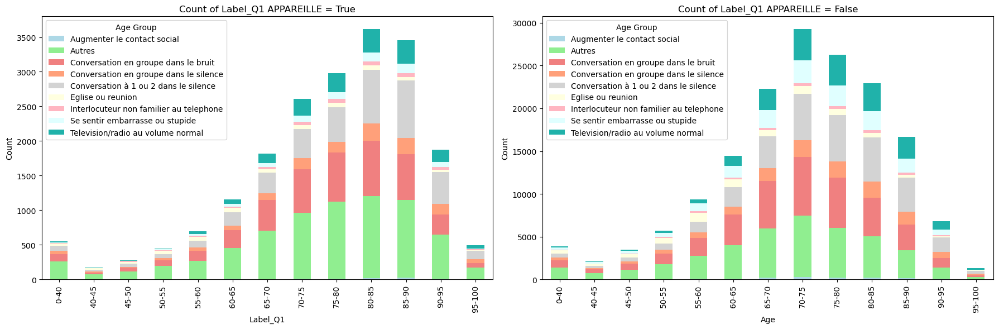

In [195]:
# Plot bar plots for count of 'Label_Q1' groups for each age group
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(18, 6))

# Plot with 'APPAREILLE'
pta_with_app_grouped = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True].groupby('AGE_GROUP')['Label_Q1'].value_counts().unstack(fill_value=0)
pta_with_app_grouped.plot(kind='bar', stacked=True, ax=axes[0], color=[age_colors[age_group] for age_group in age_labels])
axes[0].set_title('Count of Label_Q1 APPAREILLE = True')
axes[0].set_xlabel('Label_Q1')
axes[0].set_ylabel('Count')
axes[0].legend(title='Age Group')

# Plot without 'APPAREILLE'
pta_without_app_grouped = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False].groupby('AGE_GROUP')['Label_Q1'].value_counts().unstack(fill_value=0)
pta_without_app_grouped.plot(kind='bar', stacked=True, ax=axes[1], color=[age_colors[age_group] for age_group in age_labels])
axes[1].set_title('Count of Label_Q1 APPAREILLE = False')
axes[1].set_xlabel('Age')
axes[1].set_ylabel('Count')
axes[1].legend(title='Age Group')

plt.tight_layout()
plt.show()

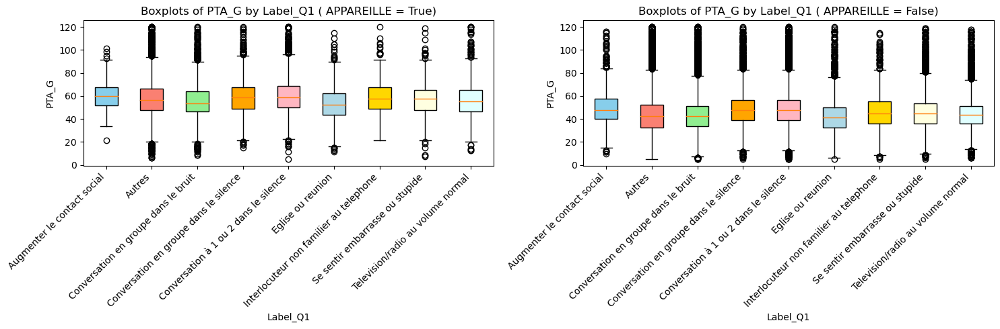

In [133]:
# Filter data with 'APPAREILLE' == True
pta_with_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True]

# Filter data with 'APPAREILLE' == False
pta_without_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False]

# Define colors for boxplots
colors = ['skyblue', 'salmon', 'lightgreen', 'orange', 'lightpink', 'lightblue', 'gold', 'lightyellow', 'lightcyan']

# Group data by 'Label_Q1' for both with and without 'APPAREILLE'
grouped_pta_with_app = pta_with_app.groupby('Label_Q1')
grouped_pta_without_app = pta_without_app.groupby('Label_Q1')

# Extract 'PTA_G' data for boxplots
pta_g_data_with_app = [group['PTA_G'].dropna() for _, group in grouped_pta_with_app]
pta_g_data_without_app = [group['PTA_G'].dropna() for _, group in grouped_pta_without_app]

# Plot boxplots for 'PTA_G' grouped by 'Label_Q1' with 'APPAREILLE'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Boxplot for 'PTA_G'
bp_g = axes[0].boxplot(pta_g_data_with_app, patch_artist=True)
for patch, color in zip(bp_g['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_xticks(range(1, len(grouped_pta_with_app)+1))
axes[0].set_xticklabels(grouped_pta_with_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[0].set_title('Boxplots of PTA_G by Label_Q1 ( APPAREILLE = True)')
axes[0].set_xlabel('Label_Q1')
axes[0].set_ylabel('PTA_G')

# Boxplot for 'PTA_D'
bp_d = axes[1].boxplot(pta_g_data_without_app, patch_artist=True)
for patch, color in zip(bp_d['boxes'], colors):
    patch.set_facecolor(color)
axes[1].set_xticks(range(1, len(grouped_pta_without_app)+1))
axes[1].set_xticklabels(grouped_pta_without_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[1].set_title('Boxplots of PTA_G by Label_Q1 ( APPAREILLE = False)')
axes[1].set_xlabel('Label_Q1')
axes[1].set_ylabel('PTA_G')

plt.tight_layout()
plt.show()

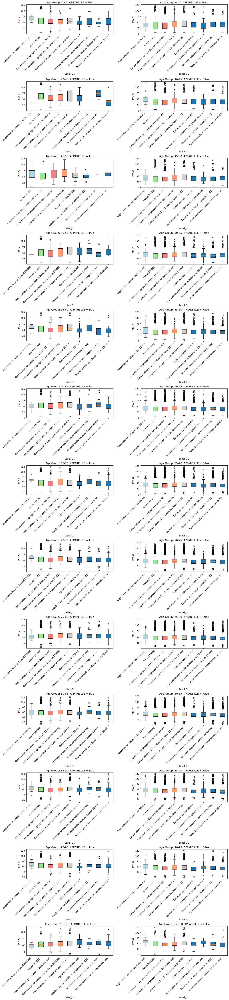

In [205]:
colors = ['skyblue', 'salmon', 'lightgreen', 'orange', 'lightpink', 'lightblue', 'gold', 'lightyellow', 'lightcyan']

# Define age groups
age_bins = [0, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
age_labels = ['0-40', '40-45', '45-50', '50-55', '55-60', '60-65', '65-70', '70-75', '75-80', '80-85', '85-90', '90-95', '95-100']

# Add 'AGE_GROUP' column to DataFrame based on age bins
df_Ps_Tests_nodep['AGE_GROUP'] = pd.cut(df_Ps_Tests_nodep['AGE'], bins=age_bins, labels=age_labels, right=False)

# Filter data with 'APPAREILLE' == True
pta_with_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True]

# Filter data with 'APPAREILLE' == False
pta_without_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False]

# Group data by 'Label_Q1' and 'AGE_GROUP' for both with and without 'APPAREILLE'
grouped_pta_with_app = pta_with_app.groupby(['Label_Q1', 'AGE_GROUP'])
grouped_pta_without_app = pta_without_app.groupby(['Label_Q1', 'AGE_GROUP'])

# Colors for boxplots
colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightgrey']

# Plot boxplots
fig, axes = plt.subplots(nrows=len(age_labels), ncols=2, figsize=(15, 65))

for i, age_group in enumerate(age_labels):
    # Boxplot with 'APPAREILLE' = True
    bp_g = axes[i, 0].boxplot([group[1]['PTA_G'].dropna().loc[group[1]['PTA_G'].dropna() > -7] for group in grouped_pta_with_app if group[0][1] == age_group], patch_artist=True)
    for patch, color in zip(bp_g['boxes'], colors):
        patch.set_facecolor(color)
    axes[i, 0].set_title(f'Age Group: {age_group}  APPAREILLE = True')
    axes[i, 0].set_xlabel('Label_Q1')
    axes[i, 0].set_ylabel('PTA_G')
    axes[i, 0].set_xticklabels([f"{label[0]} ({label[1]})" for label, _ in grouped_pta_with_app if label[1] == age_group], rotation=45, ha='right')
    
    # Boxplot with 'APPAREILLE' = False
    bp_d = axes[i, 1].boxplot([group[1]['PTA_G'].dropna() for group in grouped_pta_without_app if group[0][1] == age_group], patch_artist=True)
    for patch, color in zip(bp_d['boxes'], colors):
        patch.set_facecolor(color)
    axes[i, 1].set_title(f'Age Group: {age_group}  APPAREILLE = False')
    axes[i, 1].set_xlabel('Label_Q1')
    axes[i, 1].set_ylabel('PTA_G')
    axes[i, 1].set_xticklabels([f"{label[0]} ({label[1]})" for label, _ in grouped_pta_without_app if label[1] == age_group], rotation=45, ha='right')

plt.tight_layout()
plt.show()

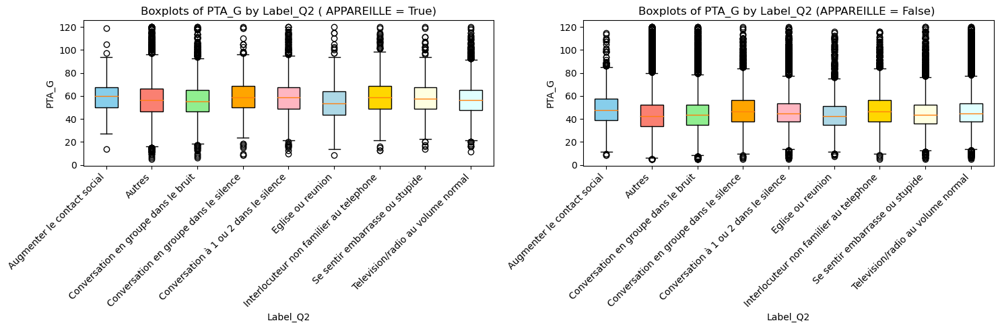

In [134]:
# Filter data with 'APPAREILLE' == True
pta_with_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True]


# Define colors for boxplots
colors = ['skyblue', 'salmon', 'lightgreen', 'orange', 'lightpink', 'lightblue', 'gold', 'lightyellow', 'lightcyan']

# Filter data with 'APPAREILLE' == False
pta_without_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False]

# Group data by 'Label_Q2' for both with and without 'APPAREILLE'
grouped_pta_with_app = pta_with_app.groupby('Label_Q2')
grouped_pta_without_app = pta_without_app.groupby('Label_Q2')

# Extract 'PTA_G' data for boxplots
pta_g_data_with_app = [group['PTA_G'].dropna() for _, group in grouped_pta_with_app]
pta_g_data_without_app = [group['PTA_G'].dropna() for _, group in grouped_pta_without_app]

# Plot boxplots for 'PTA_G' grouped by 'Label_Q2' with 'APPAREILLE'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Boxplot for 'PTA_G'
bp_g = axes[0].boxplot(pta_g_data_with_app, patch_artist=True)
for patch, color in zip(bp_g['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_xticks(range(1, len(grouped_pta_with_app)+1))
axes[0].set_xticklabels(grouped_pta_with_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[0].set_title('Boxplots of PTA_G by Label_Q2 ( APPAREILLE = True)')
axes[0].set_xlabel('Label_Q2')
axes[0].set_ylabel('PTA_G')

# Boxplot for 'PTA_D'
bp_d = axes[1].boxplot(pta_g_data_without_app, patch_artist=True)
for patch, color in zip(bp_d['boxes'], colors):
    patch.set_facecolor(color)
axes[1].set_xticks(range(1, len(grouped_pta_without_app)+1))
axes[1].set_xticklabels(grouped_pta_without_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[1].set_title('Boxplots of PTA_G by Label_Q2 (APPAREILLE = False) ')
axes[1].set_xlabel('Label_Q2')
axes[1].set_ylabel('PTA_G')

plt.tight_layout()
plt.show()


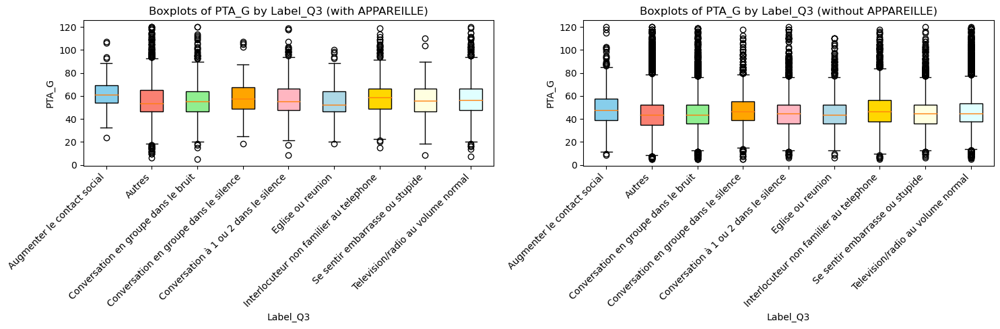

In [135]:
# Filter data with 'APPAREILLE' == True
pta_with_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True]

# Filter data with 'APPAREILLE' == False
pta_without_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False]

# Group data by 'Label_Q3' for both with and without 'APPAREILLE'
grouped_pta_with_app = pta_with_app.groupby('Label_Q3')
grouped_pta_without_app = pta_without_app.groupby('Label_Q3')

# Extract 'PTA_G' data for boxplots
pta_g_data_with_app = [group['PTA_G'].dropna() for _, group in grouped_pta_with_app]
pta_g_data_without_app = [group['PTA_G'].dropna() for _, group in grouped_pta_without_app]

# Plot boxplots for 'PTA_G' grouped by 'Label_Q3' with 'APPAREILLE'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Boxplot for 'PTA_G'
bp_g = axes[0].boxplot(pta_g_data_with_app, patch_artist=True)
for patch, color in zip(bp_g['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_xticks(range(1, len(grouped_pta_with_app)+1))
axes[0].set_xticklabels(grouped_pta_with_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[0].set_title('Boxplots of PTA_G by Label_Q3 (with APPAREILLE)')
axes[0].set_xlabel('Label_Q3')
axes[0].set_ylabel('PTA_G')

# Boxplot for 'PTA_D'
bp_d = axes[1].boxplot(pta_g_data_without_app, patch_artist=True)
for patch, color in zip(bp_d['boxes'], colors):
    patch.set_facecolor(color)
axes[1].set_xticks(range(1, len(grouped_pta_without_app)+1))
axes[1].set_xticklabels(grouped_pta_without_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[1].set_title('Boxplots of PTA_G by Label_Q3 (without APPAREILLE)')
axes[1].set_xlabel('Label_Q3')
axes[1].set_ylabel('PTA_G')

plt.tight_layout()
plt.show()

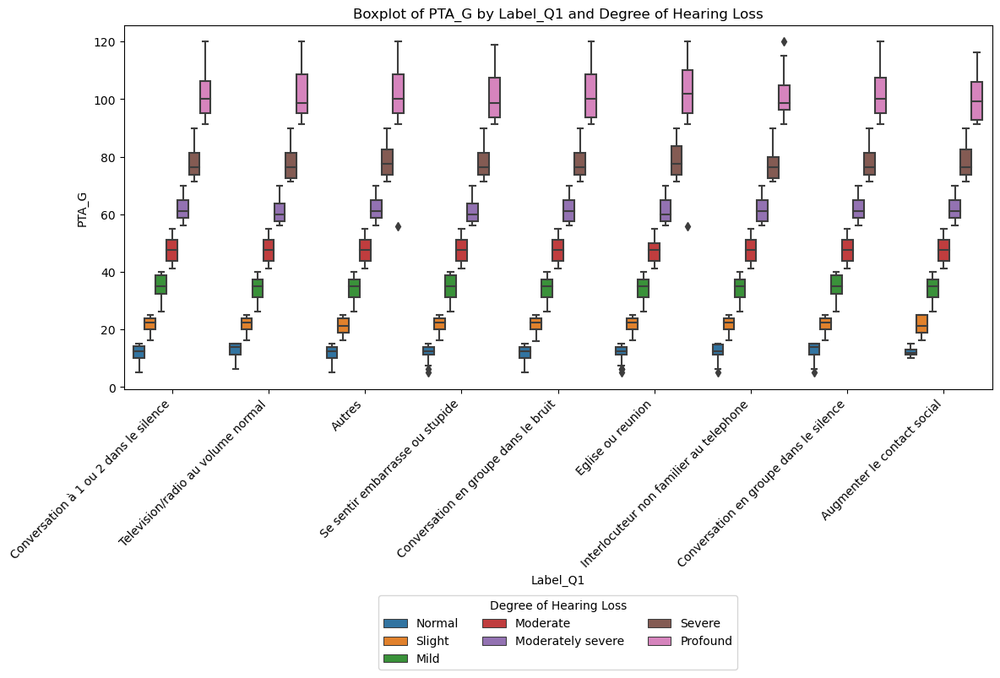

In [226]:
plt.figure(figsize=(12, 10))
sn.boxplot(data=df_Ps_Tests_nodep, x='Label_Q1', y='PTA_G', hue='HL')
plt.title('Boxplot of PTA_G by Label_Q1 and Degree of Hearing Loss')
plt.xlabel('Label_Q1')
plt.ylabel('PTA_G')
plt.legend(title='Degree of Hearing Loss', loc='upper center', bbox_to_anchor=(0.5, -0.55), ncol=3)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis tick labels by 45 degrees and align to the right
plt.tight_layout()
plt.show()

## SNR 

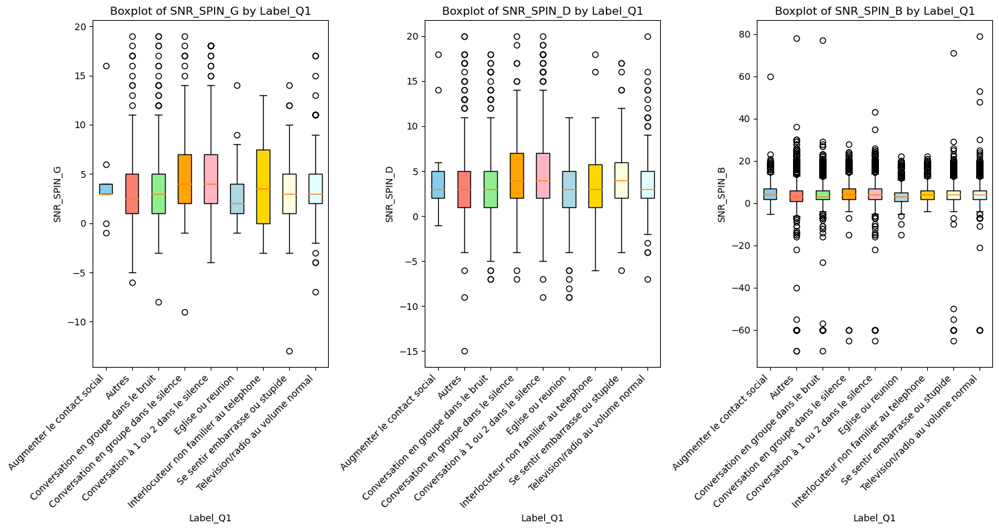

In [83]:
# Group by 'Label_Q1'
grouped_pta = df_Ps_Tests_nodep.groupby('Label_Q1')

# Extract 'PTA_G' and 'PTA_D' data for boxplot
snr_g_data = [group['SNR_SPIN_G'].dropna().loc[group['SNR_SPIN_G'].dropna() > -20] for _, group in grouped_pta]
snr_d_data = [group['SNR_SPIN_D'].dropna() for _, group in grouped_pta]
snr_b_data = [group['SNR_SPIN_B'].dropna() for _, group in grouped_pta]


# Define colors for boxplots
colors = ['skyblue', 'salmon', 'lightgreen', 'orange', 'lightpink', 'lightblue', 'gold', 'lightyellow', 'lightcyan']

# Plot boxplot for 'SNR_SPIN_G' and 'SRT_SPIQ_B' for each group
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 8))

# Boxplot for 'SNR_SPIN_G'
bp_g = axes[0].boxplot(snr_g_data, patch_artist=True)
for patch, color in zip(bp_g['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_xticks(range(1, len(grouped_pta)+1))
axes[0].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[0].set_title('Boxplot of SNR_SPIN_G by Label_Q1')
axes[0].set_xlabel('Label_Q1')
axes[0].set_ylabel('SNR_SPIN_G')

# Boxplot for 'SNR_SPIN_D'
bp_d = axes[1].boxplot(snr_d_data, patch_artist=True)
for patch, color in zip(bp_d['boxes'], colors):
    patch.set_facecolor(color)
axes[1].set_xticks(range(1, len(grouped_pta)+1))
axes[1].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[1].set_title('Boxplot of SNR_SPIN_D by Label_Q1')
axes[1].set_xlabel('Label_Q1')
axes[1].set_ylabel('SNR_SPIN_D')

# Boxplot for 'SNR_SPIN_B'
bp_b = axes[2].boxplot(snr_b_data, patch_artist=True)
for patch, color in zip(bp_b['boxes'], colors):
    patch.set_facecolor(color)
axes[2].set_xticks(range(1, len(grouped_pta)+1))
axes[2].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[2].set_title('Boxplot of SNR_SPIN_B by Label_Q1')
axes[2].set_xlabel('Label_Q1')
axes[2].set_ylabel('SNR_SPIN_B')

plt.tight_layout()
plt.show()

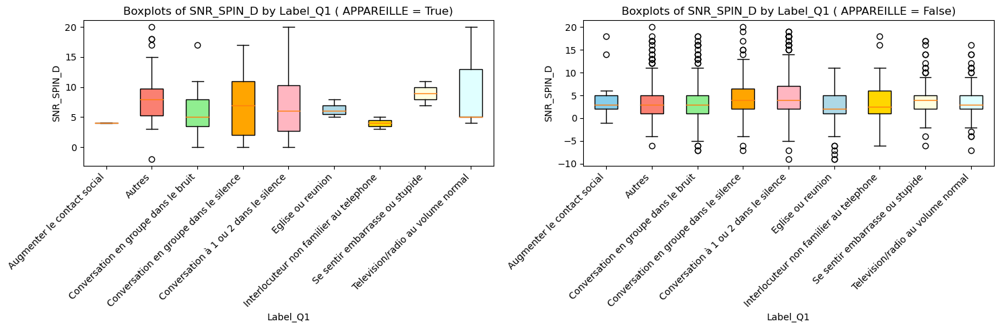

In [124]:
colors = ['skyblue', 'salmon', 'lightgreen', 'orange', 'lightpink', 'lightblue', 'gold', 'lightyellow', 'lightcyan']

# Filter data with 'APPAREILLE' == True
snr_with_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True]

# Filter data with 'APPAREILLE' == False
snr_without_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False]

# Group data by 'Label_Q1' for both with and without 'APPAREILLE'
grouped_snr_with_app = snr_with_app.groupby('Label_Q1')
grouped_snr_without_app = snr_without_app.groupby('Label_Q1')

# Extract 'SNR_SPIN_D' data for boxplots
snr_g_data_with_app = [group['SNR_SPIN_D'].dropna().loc[group['SNR_SPIN_D'].dropna() > -7] for _, group in grouped_snr_with_app]
snr_g_data_without_app = [group['SNR_SPIN_D'].dropna() for _, group in grouped_snr_without_app]

# Plot boxplots for 'SNR_SPIN_D' grouped by 'Label_Q1' with 'APPAREILLE'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Boxplot for 'SNR_SPIN_D'
bp_g = axes[0].boxplot(snr_g_data_with_app, patch_artist=True)
for patch, color in zip(bp_g['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_xticks(range(1, len(grouped_snr_with_app)+1))
axes[0].set_xticklabels(grouped_snr_with_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[0].set_title('Boxplots of SNR_SPIN_D by Label_Q1 ( APPAREILLE = True)')
axes[0].set_xlabel('Label_Q1')
axes[0].set_ylabel('SNR_SPIN_D')

# Boxplot for 'SNR_SPIN_D'
bp_d = axes[1].boxplot(snr_g_data_without_app, patch_artist=True)
for patch, color in zip(bp_d['boxes'], colors):
    patch.set_facecolor(color)
axes[1].set_xticks(range(1, len(grouped_snr_without_app)+1))
axes[1].set_xticklabels(grouped_snr_without_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[1].set_title('Boxplots of SNR_SPIN_D by Label_Q1 ( APPAREILLE = False)')
axes[1].set_xlabel('Label_Q1')
axes[1].set_ylabel('SNR_SPIN_D')

plt.tight_layout()
plt.show()

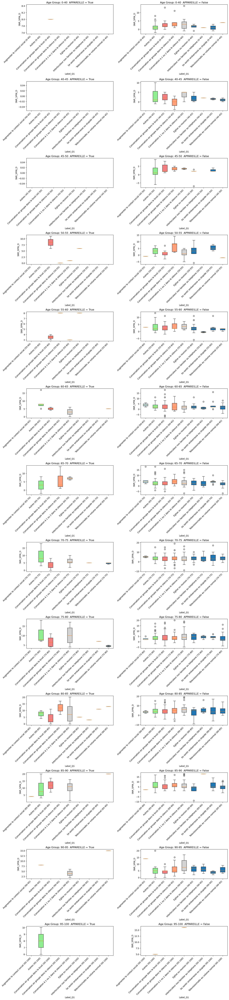

In [125]:
colors = ['skyblue', 'salmon', 'lightgreen', 'orange', 'lightpink', 'lightblue', 'gold', 'lightyellow', 'lightcyan']

# Define age groups
age_bins = [0, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
age_labels = ['0-40', '40-45', '45-50', '50-55', '55-60', '60-65', '65-70', '70-75', '75-80', '80-85', '85-90', '90-95', '95-100']

# Add 'AGE_GROUP' column to DataFrame based on age bins
df_Ps_Tests_nodep['AGE_GROUP'] = pd.cut(df_Ps_Tests_nodep['AGE'], bins=age_bins, labels=age_labels, right=False)

# Filter data with 'APPAREILLE' == True
snr_with_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True]

# Filter data with 'APPAREILLE' == False
snr_without_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False]

# Group data by 'Label_Q1' and 'AGE_GROUP' for both with and without 'APPAREILLE'
grouped_snr_with_app = snr_with_app.groupby(['Label_Q1', 'AGE_GROUP'])
grouped_snr_without_app = snr_without_app.groupby(['Label_Q1', 'AGE_GROUP'])

# Colors for boxplots
colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightgrey']

# Plot boxplots
fig, axes = plt.subplots(nrows=len(age_labels), ncols=2, figsize=(15, 65))

for i, age_group in enumerate(age_labels):
    # Boxplot with 'APPAREILLE' = True
    bp_g = axes[i, 0].boxplot([group[1]['SNR_SPIN_D'].dropna().loc[group[1]['SNR_SPIN_D'].dropna() > -7] for group in grouped_snr_with_app if group[0][1] == age_group], patch_artist=True)
    for patch, color in zip(bp_g['boxes'], colors):
        patch.set_facecolor(color)
    axes[i, 0].set_title(f'Age Group: {age_group}  APPAREILLE = True')
    axes[i, 0].set_xlabel('Label_Q1')
    axes[i, 0].set_ylabel('SNR_SPIN_D')
    axes[i, 0].set_xticklabels([f"{label[0]} ({label[1]})" for label, _ in grouped_snr_with_app if label[1] == age_group], rotation=45, ha='right')
    
    # Boxplot with 'APPAREILLE' = False
    bp_d = axes[i, 1].boxplot([group[1]['SNR_SPIN_D'].dropna() for group in grouped_snr_without_app if group[0][1] == age_group], patch_artist=True)
    for patch, color in zip(bp_d['boxes'], colors):
        patch.set_facecolor(color)
    axes[i, 1].set_title(f'Age Group: {age_group}  APPAREILLE = False')
    axes[i, 1].set_xlabel('Label_Q1')
    axes[i, 1].set_ylabel('SNR_SPIN_D')
    axes[i, 1].set_xticklabels([f"{label[0]} ({label[1]})" for label, _ in grouped_snr_without_app if label[1] == age_group], rotation=45, ha='right')

plt.tight_layout()
plt.show()

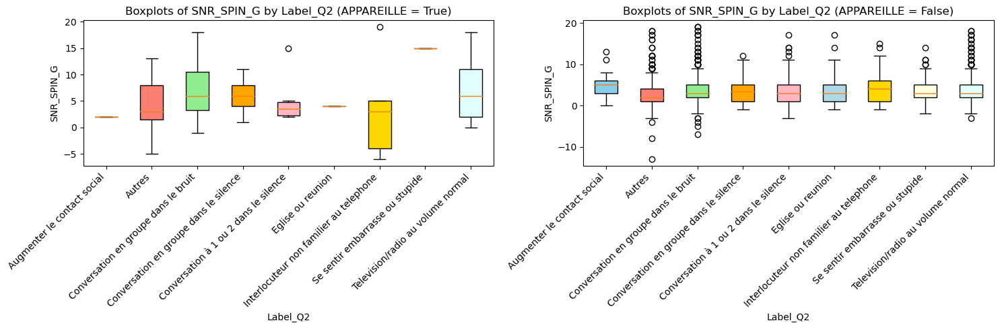

In [137]:
# Filter data with 'APPAREILLE' == True
snr_with_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True]

# Filter data with 'APPAREILLE' == False
snr_without_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False]

# Group data by 'Label_Q2' for both with and without 'APPAREILLE'
grouped_snr_with_app = snr_with_app.groupby('Label_Q2')
grouped_snr_without_app = snr_without_app.groupby('Label_Q2')

# Extract 'SNR_SPIN_G' data for boxplots
snr_g_data_with_app = [group['SNR_SPIN_G'].dropna().loc[group['SNR_SPIN_G'].dropna() > -7]   for _, group in grouped_snr_with_app]
snr_g_data_without_app = [group['SNR_SPIN_G'].dropna().loc[group['SNR_SPIN_G'].dropna() > -20] for _, group in grouped_snr_without_app]

# Plot boxplots for 'SNR_SPIN_G' grouped by 'Label_Q1' with 'APPAREILLE'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Boxplot for 'SNR_SPIN_G'
bp_g = axes[0].boxplot(snr_g_data_with_app, patch_artist=True)
for patch, color in zip(bp_g['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_xticks(range(1, len(grouped_snr_with_app)+1))
axes[0].set_xticklabels(grouped_snr_with_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[0].set_title('Boxplots of SNR_SPIN_G by Label_Q2 (APPAREILLE = True)')
axes[0].set_xlabel('Label_Q2')
axes[0].set_ylabel('SNR_SPIN_G')

# Boxplot for 'SNR_SPIN_G'
bp_d = axes[1].boxplot(snr_g_data_without_app, patch_artist=True)
for patch, color in zip(bp_d['boxes'], colors):
    patch.set_facecolor(color)
axes[1].set_xticks(range(1, len(grouped_snr_without_app)+1))
axes[1].set_xticklabels(grouped_snr_without_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[1].set_title('Boxplots of SNR_SPIN_G by Label_Q2 (APPAREILLE = False)')
axes[1].set_xlabel('Label_Q2')
axes[1].set_ylabel('SNR_SPIN_G')

plt.tight_layout()
plt.show()

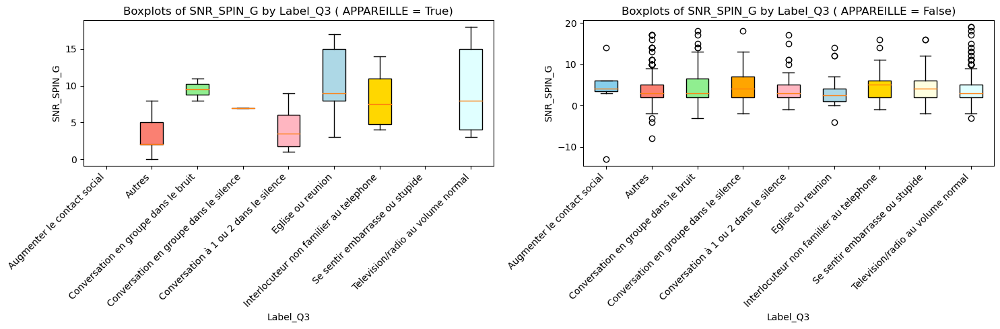

In [139]:
# Filter data with 'APPAREILLE' == True
snr_with_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True]

# Filter data with 'APPAREILLE' == False
snr_without_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False]

# Group data by 'Label_Q3' for both with and without 'APPAREILLE'
grouped_snr_with_app = snr_with_app.groupby('Label_Q3')
grouped_snr_without_app = snr_without_app.groupby('Label_Q3')

# Extract 'SNR_SPIN_G' data for boxplots
snr_g_data_with_app = [group['SNR_SPIN_G'].dropna().loc[group['SNR_SPIN_G'].dropna() > -7]  for _, group in grouped_snr_with_app]
snr_g_data_without_app = [group['SNR_SPIN_G'].dropna().loc[group['SNR_SPIN_G'].dropna() > -20]  for _, group in grouped_snr_without_app]

# Plot boxplots for 'SNR_SPIN_G' grouped by 'Label_Q1' with 'APPAREILLE'
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Boxplot for 'SNR_SPIN_G'
bp_g = axes[0].boxplot(snr_g_data_with_app, patch_artist=True)
for patch, color in zip(bp_g['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_xticks(range(1, len(grouped_snr_with_app)+1))
axes[0].set_xticklabels(grouped_snr_with_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[0].set_title('Boxplots of SNR_SPIN_G by Label_Q3 ( APPAREILLE = True)')
axes[0].set_xlabel('Label_Q3')
axes[0].set_ylabel('SNR_SPIN_G')

# Boxplot for 'SNR_SPIN_G'
bp_d = axes[1].boxplot(snr_g_data_without_app, patch_artist=True)
for patch, color in zip(bp_d['boxes'], colors):
    patch.set_facecolor(color)
axes[1].set_xticks(range(1, len(grouped_snr_without_app)+1))
axes[1].set_xticklabels(grouped_snr_without_app.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[1].set_title('Boxplots of SNR_SPIN_G by Label_Q3 ( APPAREILLE = False)')
axes[1].set_xlabel('Label_Q3')
axes[1].set_ylabel('SNR_SPIN_G')

plt.tight_layout()
plt.show()

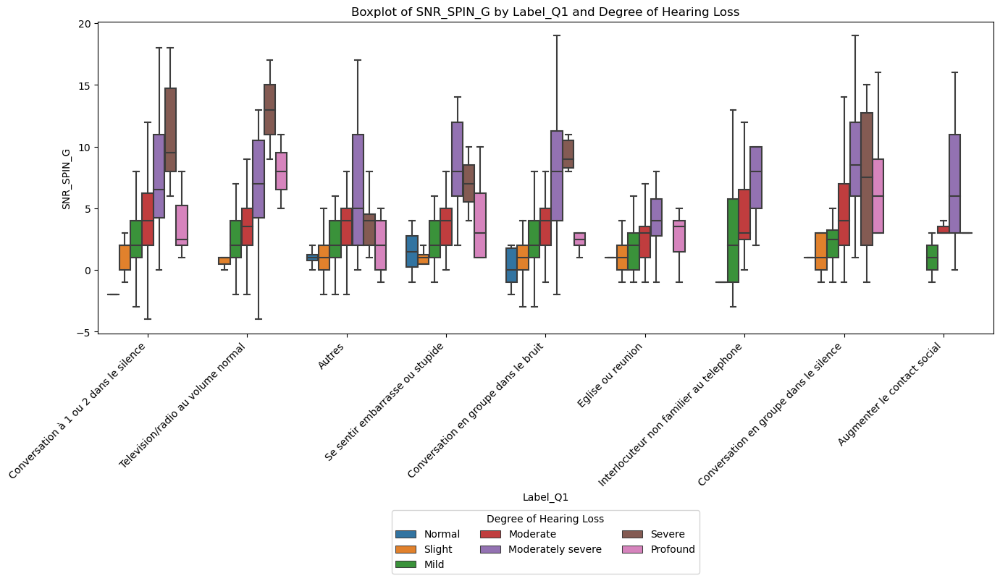

In [230]:
plt.figure(figsize=(14, 10))
sn.boxplot(data=df_Ps_Tests_nodep, x='Label_Q1', y='SNR_SPIN_G', hue='HL', showfliers=False)
plt.title('Boxplot of SNR_SPIN_G by Label_Q1 and Degree of Hearing Loss')
plt.xlabel('Label_Q1')
plt.ylabel('SNR_SPIN_G')
plt.legend(title='Degree of Hearing Loss', loc='upper center', bbox_to_anchor=(0.5, -0.55), ncol=3)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis tick labels by 45 degrees and align to the right
plt.tight_layout()
plt.show()

# SRT

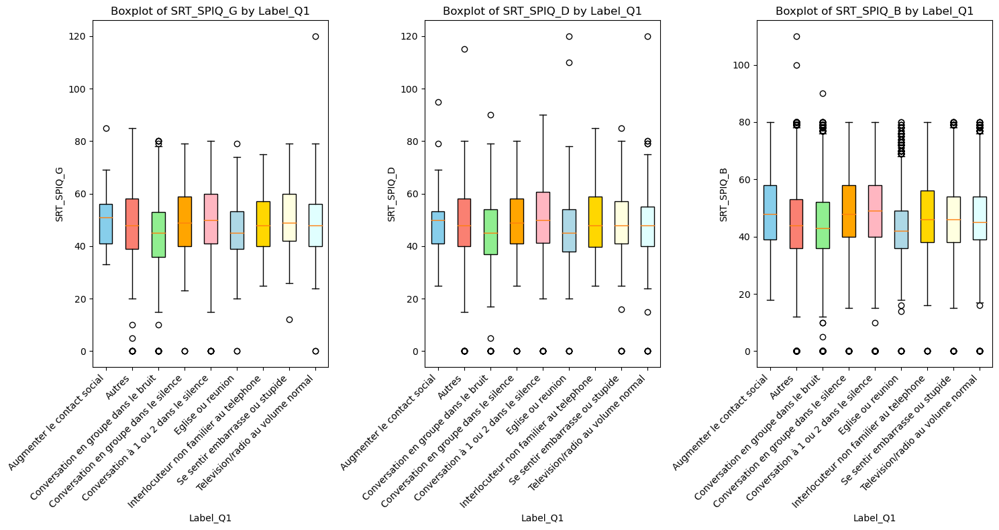

In [88]:
# Group by 'Label_Q1'
grouped_pta = df_Ps_Tests_nodep.groupby('Label_Q1') # Label_Q2 Label_Q3

# Extract 'PTA_G' and 'PTA_D' data for boxplot
snr_g_data = [group['SRT_SPIQ_G'].dropna() for _, group in grouped_pta]
snr_d_data = [group['SRT_SPIQ_D'].dropna() for _, group in grouped_pta]
snr_b_data = [group['SRT_SPIQ_B'].dropna() for _, group in grouped_pta]


# Define colors for boxplots
colors = ['skyblue', 'salmon', 'lightgreen', 'orange', 'lightpink', 'lightblue', 'gold', 'lightyellow', 'lightcyan']

# Plot boxplot for 'SNR_SPIN_G' and 'SRT_SPIQ_B' for each group
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 8))

# Boxplot for 'SNR_SPIN_G'
bp_g = axes[0].boxplot(snr_g_data, patch_artist=True)
for patch, color in zip(bp_g['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_xticks(range(1, len(grouped_pta)+1))
axes[0].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[0].set_title('Boxplot of SRT_SPIQ_G by Label_Q1')
axes[0].set_xlabel('Label_Q1')
axes[0].set_ylabel('SRT_SPIQ_G')

# Boxplot for 'SRT_SPIQ_D'
bp_d = axes[1].boxplot(snr_d_data, patch_artist=True)
for patch, color in zip(bp_d['boxes'], colors):
    patch.set_facecolor(color)
axes[1].set_xticks(range(1, len(grouped_pta)+1))
axes[1].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[1].set_title('Boxplot of SRT_SPIQ_D by Label_Q1')
axes[1].set_xlabel('Label_Q1')
axes[1].set_ylabel('SRT_SPIQ_D')

# Boxplot for 'SNR_SPIN_B'
bp_b = axes[2].boxplot(snr_b_data, patch_artist=True)
for patch, color in zip(bp_b['boxes'], colors):
    patch.set_facecolor(color)
axes[2].set_xticks(range(1, len(grouped_pta)+1))
axes[2].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[2].set_title('Boxplot of SRT_SPIQ_B by Label_Q1')
axes[2].set_xlabel('Label_Q1')
axes[2].set_ylabel('SRT_SPIQ_B')

plt.tight_layout()
plt.show()

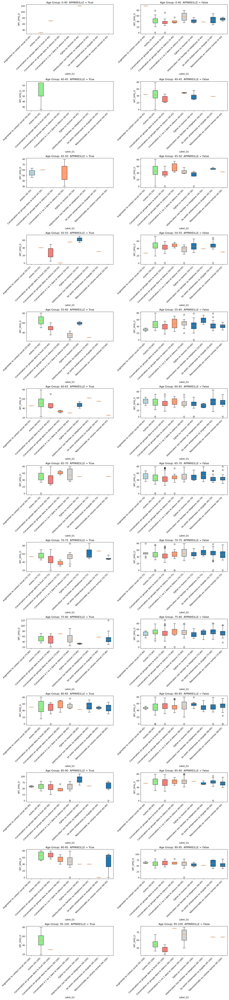

In [126]:
colors = ['skyblue', 'salmon', 'lightgreen', 'orange', 'lightpink', 'lightblue', 'gold', 'lightyellow', 'lightcyan']

# Define age groups
age_bins = [0, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
age_labels = ['0-40', '40-45', '45-50', '50-55', '55-60', '60-65', '65-70', '70-75', '75-80', '80-85', '85-90', '90-95', '95-100']

# Add 'AGE_GROUP' column to DataFrame based on age bins
df_Ps_Tests_nodep['AGE_GROUP'] = pd.cut(df_Ps_Tests_nodep['AGE'], bins=age_bins, labels=age_labels, right=False)

# Filter data with 'APPAREILLE' == True
snr_with_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == True]

# Filter data with 'APPAREILLE' == False
snr_without_app = df_Ps_Tests_nodep[df_Ps_Tests_nodep['APPAREILLE'] == False]

# Group data by 'Label_Q1' and 'AGE_GROUP' for both with and without 'APPAREILLE'
grouped_snr_with_app = snr_with_app.groupby(['Label_Q1', 'AGE_GROUP'])
grouped_snr_without_app = snr_without_app.groupby(['Label_Q1', 'AGE_GROUP'])

# Colors for boxplots
colors = ['lightblue', 'lightgreen', 'lightcoral', 'lightsalmon', 'lightgrey']

# Plot boxplots
fig, axes = plt.subplots(nrows=len(age_labels), ncols=2, figsize=(15, 65))

for i, age_group in enumerate(age_labels):
    # Boxplot with 'APPAREILLE' = True
    bp_g = axes[i, 0].boxplot([group[1]['SRT_SPIQ_D'].dropna().loc[group[1]['SRT_SPIQ_D'].dropna() > -7] for group in grouped_snr_with_app if group[0][1] == age_group], patch_artist=True)
    for patch, color in zip(bp_g['boxes'], colors):
        patch.set_facecolor(color)
    axes[i, 0].set_title(f'Age Group: {age_group}  APPAREILLE = True')
    axes[i, 0].set_xlabel('Label_Q1')
    axes[i, 0].set_ylabel('SRT_SPIQ_D')
    axes[i, 0].set_xticklabels([f"{label[0]} ({label[1]})" for label, _ in grouped_snr_with_app if label[1] == age_group], rotation=45, ha='right')
    
    # Boxplot with 'APPAREILLE' = False
    bp_d = axes[i, 1].boxplot([group[1]['SRT_SPIQ_D'].dropna() for group in grouped_snr_without_app if group[0][1] == age_group], patch_artist=True)
    for patch, color in zip(bp_d['boxes'], colors):
        patch.set_facecolor(color)
    axes[i, 1].set_title(f'Age Group: {age_group}  APPAREILLE = False')
    axes[i, 1].set_xlabel('Label_Q1')
    axes[i, 1].set_ylabel('SRT_SPIQ_D')
    axes[i, 1].set_xticklabels([f"{label[0]} ({label[1]})" for label, _ in grouped_snr_without_app if label[1] == age_group], rotation=45, ha='right')

plt.tight_layout()
plt.show()

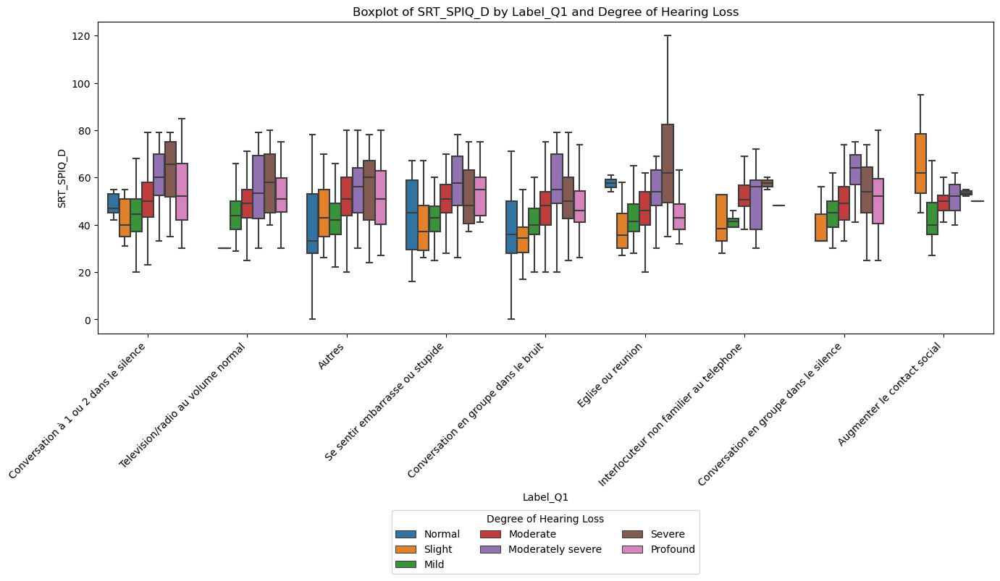

In [232]:
plt.figure(figsize=(14, 10))
sn.boxplot(data=df_Ps_Tests_nodep, x='Label_Q1', y='SRT_SPIQ_D', hue='HL', showfliers=False)
plt.title('Boxplot of SRT_SPIQ_D by Label_Q1 and Degree of Hearing Loss')
plt.xlabel('Label_Q1')
plt.ylabel('SRT_SPIQ_D')
plt.legend(title='Degree of Hearing Loss', loc='upper center', bbox_to_anchor=(0.5, -0.55), ncol=3)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis tick labels by 45 degrees and align to the right
plt.tight_layout()
plt.show()

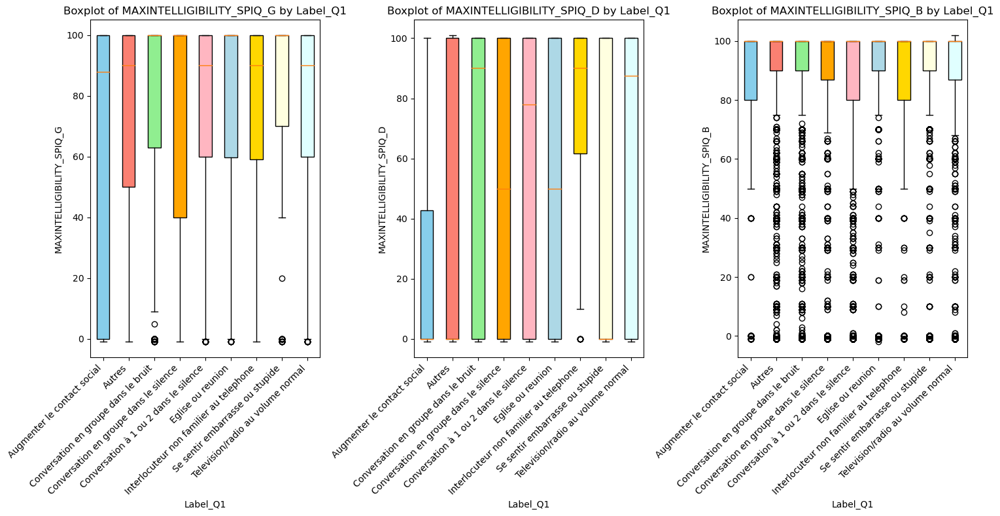

In [231]:
# Group by 'Label_Q1'
grouped_pta = df_Ps_Tests_nodep.groupby('Label_Q1') # Label_Q2 Label_Q3

# Extract 'PTA_G' and 'PTA_D' data for boxplot
snr_g_data = [group['MAXINTELLIGIBILITY_SPIQ_G'].dropna() for _, group in grouped_pta]
snr_d_data = [group['MAXINTELLIGIBILITY_SPIQ_D'].dropna() for _, group in grouped_pta]
snr_b_data = [group['MAXINTELLIGIBILITY_SPIQ_B'].dropna() for _, group in grouped_pta]


# Define colors for boxplots
colors = ['skyblue', 'salmon', 'lightgreen', 'orange', 'lightpink', 'lightblue', 'gold', 'lightyellow', 'lightcyan']

# Plot boxplot for 'SNR_SPIN_G' and 'SRT_SPIQ_B' for each group
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 8))

# Boxplot for 'MAXINTELLIGIBILITY_SPIQ_G'
bp_g = axes[0].boxplot(snr_g_data, patch_artist=True)
for patch, color in zip(bp_g['boxes'], colors):
    patch.set_facecolor(color)
axes[0].set_xticks(range(1, len(grouped_pta)+1))
axes[0].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[0].set_title('Boxplot of MAXINTELLIGIBILITY_SPIQ_G by Label_Q1')
axes[0].set_xlabel('Label_Q1')
axes[0].set_ylabel('MAXINTELLIGIBILITY_SPIQ_G')

# Boxplot for 'MAXINTELLIGIBILITY_SPIQ_D'
bp_d = axes[1].boxplot(snr_d_data, patch_artist=True)
for patch, color in zip(bp_d['boxes'], colors):
    patch.set_facecolor(color)
axes[1].set_xticks(range(1, len(grouped_pta)+1))
axes[1].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[1].set_title('Boxplot of MAXINTELLIGIBILITY_SPIQ_D by Label_Q1')
axes[1].set_xlabel('Label_Q1')
axes[1].set_ylabel('MAXINTELLIGIBILITY_SPIQ_D')

# Boxplot for 'MAXINTELLIGIBILITY_SPIQ_B'
bp_b = axes[2].boxplot(snr_b_data, patch_artist=True)
for patch, color in zip(bp_b['boxes'], colors):
    patch.set_facecolor(color)
axes[2].set_xticks(range(1, len(grouped_pta)+1))
axes[2].set_xticklabels(grouped_pta.groups.keys(), rotation=45, ha='right')  # Rotate and align x-axis labels
axes[2].set_title('Boxplot of MAXINTELLIGIBILITY_SPIQ_B by Label_Q1')
axes[2].set_xlabel('Label_Q1')
axes[2].set_ylabel('MAXINTELLIGIBILITY_SPIQ_B')

plt.tight_layout()
plt.show()